In [54]:
import numpy as np
import gymnasium as gym
from gymnasium import spaces
import random
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import pickle
import os
import cv2

In [55]:
class AutoDrone(gym.Env):
    def __init__(self):
        super(AutoDrone, self).__init__()
        self.grid_s = 6
        self.action_space = spaces.Discrete(6)   # There are 6 different possible actions we can take.
        self.observation_space = spaces.Tuple((spaces.Discrete(self.grid_s), spaces.Discrete(self.grid_s), spaces.Discrete(2)))  # Here we are defining the observation space stating that the space is of 6x6 grid and we set 1 for drone carrying obj and 0 for not carrying
        self.warehouse_loc = (0, 0)
        self.delivery_loc = (5, 5)
        self.nofly = {(2, 2), (2, 3), (3, 2), (3, 3)}   # I have selected these 3 grids as no fly zone
        self.up, self.down, self.left, self.right, self.pick, self.drop = 0, 1, 2, 3, 4, 5

        self.reset()
        
    def reset(self):
        #we use this function to reset the env by setting all the variables like package, current position etc
        super().reset()
        while True:
            self.curr_pos = ( random.randint(0, self.grid_s-1),random.randint(0, self.grid_s-1))   # selecting random location of drone everytime
            if self.curr_pos not in self.nofly:
                break
        self.package = False
        if self.render_mode == "human":
            self._render_frame()
        return (self.curr_pos[0], self.curr_pos[1], int(self.package)), {}
    
    def step(self, action):
        ep_end = False
        reward = -1             #for every step simply assigning -1 reward to increase drone fastness
        x, y = self.curr_pos
        
        if action <= 3:  #based on the action, moving the drone position in the grid.
            if action == self.up:  
                new_pos = (x, min(y + 1, self.grid_s - 1))
            elif action == self.down:  
                new_pos = (x, max(y - 1, 0))
            elif action == self.left:  
                new_pos = (max(x - 1, 0), y)
            elif action == self.right:  
                new_pos = (min(x + 1, self.grid_s - 1), y)
                
            if new_pos in self.nofly:    #assigning negative reward if drone enters no fly zone and ending the episode
                reward = -100
                ep_end = True
            else:
                self.curr_pos = new_pos    
                
        elif action == self.pick:  
            if self.curr_pos == self.warehouse_loc and not self.package:
                self.package = True
                reward = 25               #if drone picks the package then reward it +25
            else:
                reward = -10         #assigning negative reward if drone tries to perform pickup even if there is no package
                
        elif action == self.drop:  
            if self.curr_pos == self.delivery_loc and self.package:
                self.package = False
                reward = 100                 #rewarding the drone 100 if it delivers the package ep_endfully
                ep_end = True
            else: 
                reward = -10               #assigning negative reward if drone tries to perform drop when destination is not reached
                
        return (self.curr_pos[0], self.curr_pos[1], int(self.package)), reward, ep_end, False, {}
    
    def render(self, mode='human', plot=False):
        fig, ax = plt.subplots()

        def plot_image(plot_pos):
            drone = False
            droneAndpackage = False
            warehouse = False
            delivery_point = False
            noFlyZ = False
            cld = False

            fixed_size = (60, 50)  
            def preprocessImg(image_path):
                normalized_path = os.path.normpath(image_path)
                if not os.path.exists(normalized_path):
                    print(f"Error: Image not found at {normalized_path}")
                    return None
                img = plt.imread(normalized_path)
                resized_img = cv2.resize(img, fixed_size, interpolation=cv2.INTER_AREA)
                return resized_img

            plot_pos = np.array(plot_pos)
            if np.array_equal(plot_pos, self.curr_pos) and not self.package:
                drone = True
            elif np.array_equal(plot_pos, self.curr_pos) and self.package:
                droneAndpackage = True
            elif np.array_equal(plot_pos, self.warehouse_loc):
                warehouse = True
            elif np.array_equal(plot_pos, self.delivery_loc):
                delivery_point = True
            elif tuple(plot_pos) in self.nofly:
                noFlyZ = True
            else:
                cld = True

            if drone and all(not item for item in [droneAndpackage, warehouse, delivery_point, noFlyZ, cld]):
                drone_img = preprocessImg('./images/drone.jpg')
                if drone_img is not None:
                    drone_box = AnnotationBbox(OffsetImage(drone_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(drone_box)

            elif droneAndpackage and all(not item for item in [drone, warehouse, delivery_point, noFlyZ, cld]):
                drone_package_img = preprocessImg('./images/drone+package.jpg')
                if drone_package_img is not None:
                    drone_package_box = AnnotationBbox(OffsetImage(drone_package_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(drone_package_box)

            elif warehouse and all(not item for item in [drone, droneAndpackage, delivery_point, noFlyZ, cld]):
                warehouse_img = preprocessImg('./images/warehouse.jpg')
                if warehouse_img is not None:
                    warehouse_box = AnnotationBbox(OffsetImage(warehouse_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(warehouse_box)

            elif delivery_point and all(not item for item in [drone, droneAndpackage, warehouse, noFlyZ, cld]):
                delivery_img = preprocessImg('./images/deliveryHouse.jpg')
                if delivery_img is not None:
                    delivery_box = AnnotationBbox(OffsetImage(delivery_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(delivery_box)

            elif noFlyZ and all(not item for item in [drone, droneAndpackage, warehouse, delivery_point, cld]):
                nofly_img = preprocessImg('./images/noflyzone.jpg')
                if nofly_img is not None:
                    nofly_box = AnnotationBbox(OffsetImage(nofly_img, zoom=1), np.add(plot_pos, [0.5, 0.5]), frameon=False) 
                    ax.add_artist(nofly_box)

            elif cld and all(not item for item in [drone, droneAndpackage, warehouse, delivery_point, noFlyZ]):
                cld_img = preprocessImg('./images/clouds.jpg')
                if cld_img is not None:
                    cld_box = AnnotationBbox(OffsetImage(cld_img, zoom=1),
                                        np.add(plot_pos, [0.5, 0.5]), frameon=False)
                    ax.add_artist(cld_box)
        mapping = {}
        for j in range(self.grid_s * self.grid_s):
            mapping[j] = np.array([j % self.grid_s, int(np.floor(j / self.grid_s))])

        for position in mapping:
            plot_image(mapping[position])

        plt.xticks(range(self.grid_s+1))
        plt.yticks(range(self.grid_s+1))
        plt.grid()
        plt.title('Drone Environment')

        if plot:
            plt.show()
        else:
            fig.canvas.draw()
            img = np.array(fig.canvas.renderer.buffer_rgba())[:, :, :3]
            width = height = 100
            preprocessed_image = cv2.resize(img, (width, height), interpolation=cv2.INTER_AREA)
            plt.show()
            plt.pause(0.1)
            return preprocessed_image

current state is: (4, 5, 0), Action taken: 0, Reward: -1


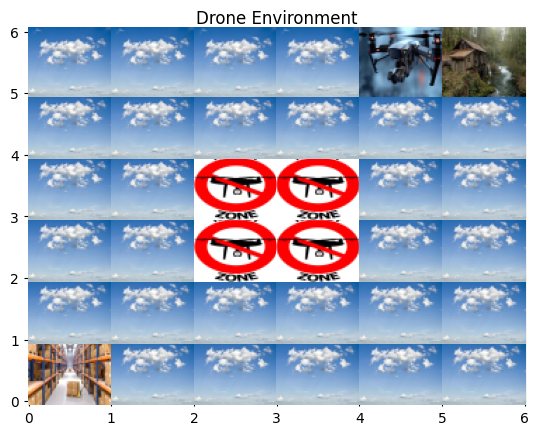

current state is: (4, 4, 0), Action taken: 1, Reward: -1


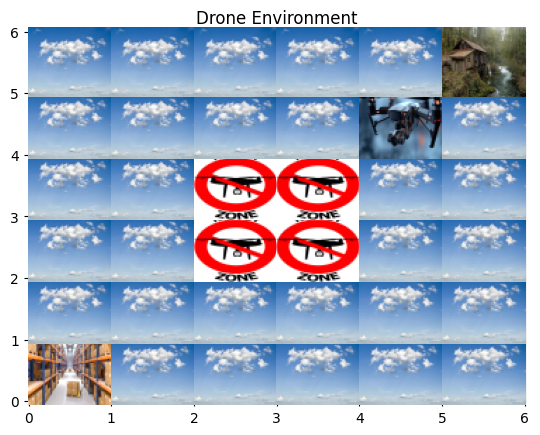

current state is: (3, 4, 0), Action taken: 2, Reward: -1


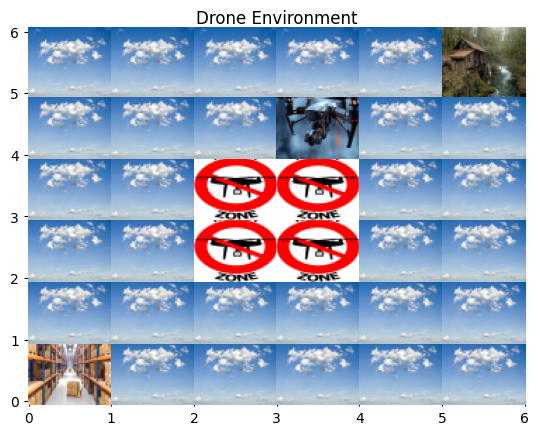

current state is: (3, 4, 0), Action taken: 4, Reward: -10


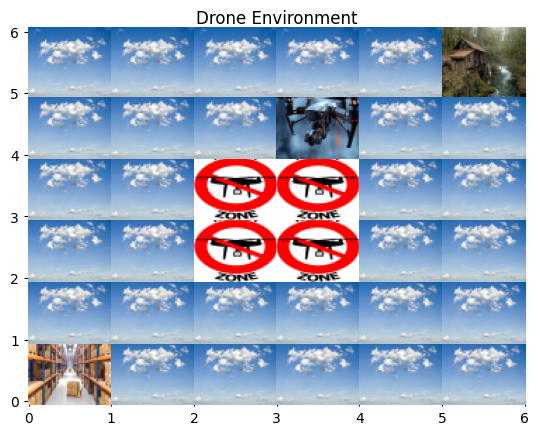

current state is: (2, 4, 0), Action taken: 2, Reward: -1


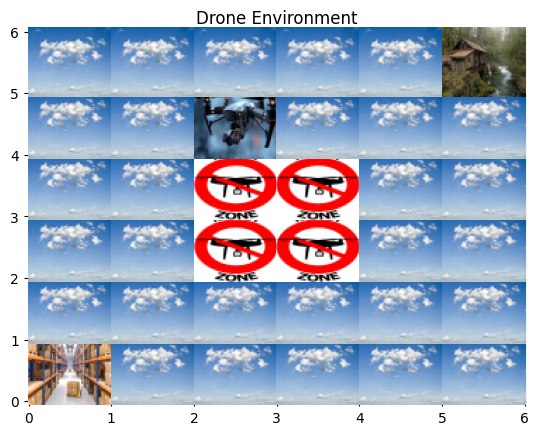

current state is: (2, 5, 0), Action taken: 0, Reward: -1


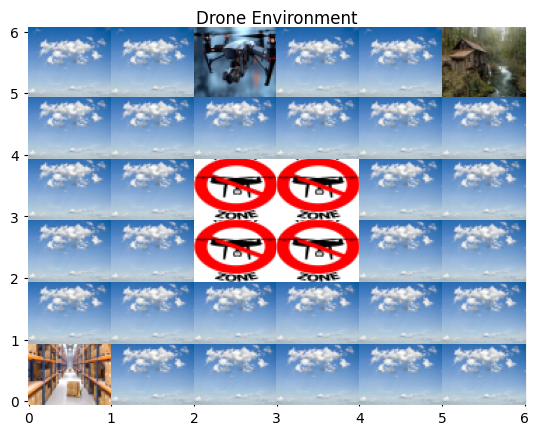

current state is: (2, 5, 0), Action taken: 5, Reward: -10


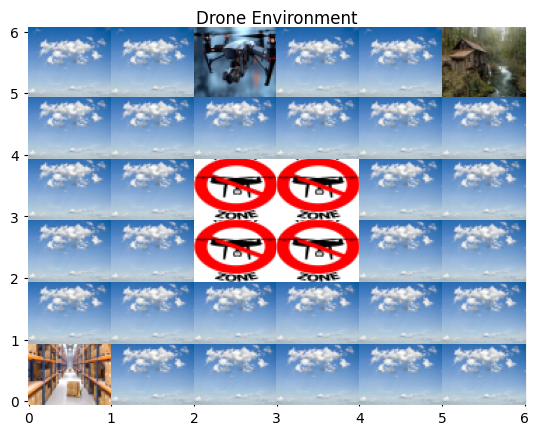

current state is: (2, 5, 0), Action taken: 0, Reward: -1


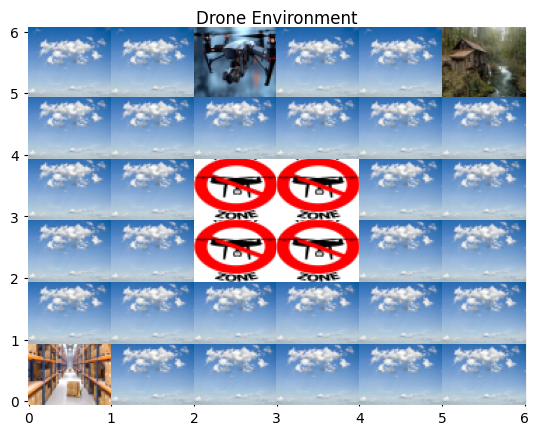

current state is: (2, 5, 0), Action taken: 0, Reward: -1


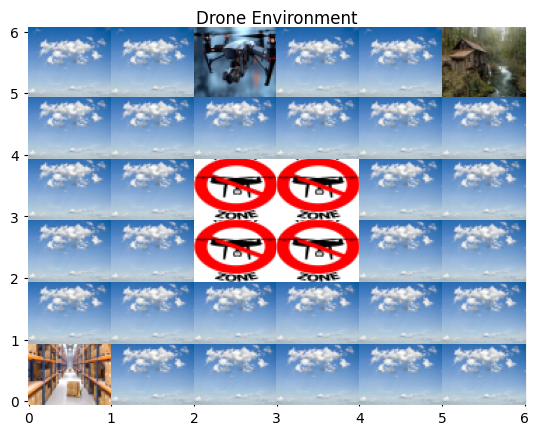

current state is: (2, 5, 0), Action taken: 0, Reward: -1


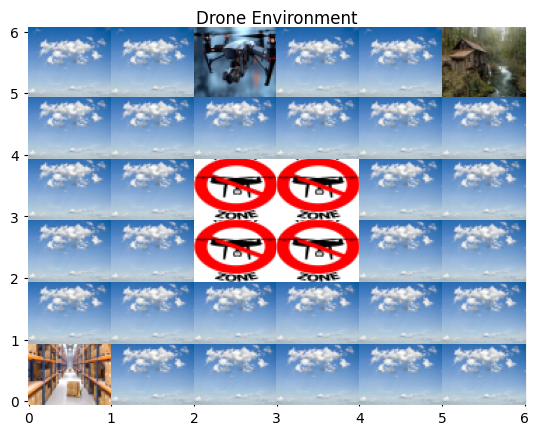

In [56]:
if __name__ == "__main__":
    env = AutoDrone()
    env.reset()

    for _ in range(10):
        action = env.action_space.sample()
        state, reward, ep_end, _, _ = env.step(action)
        print(f"current state is: {state}, Action taken: {action}, Reward: {reward}")
        env.render()
        if ep_end:
            break

In [57]:
class AgentQlearn:
    def __init__(self, env, lr=0.1, discount=0.999, epsilon=1.0, epsilon_decay=0.995, epsilon_min=0.01):
        self.env = env
        self.lr = lr
        self.discount = discount
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min
        self.qTable = {}
        self.initial_table = None
        
    def action_selection(self, state, training=True):
        if state not in self.qTable:
            self.qTable[state] = np.zeros(self.env.action_space.n)   
        if training and random.random() < self.epsilon:
            return self.env.action_space.sample()
        return np.argmax(self.qTable[state])
    
    def train(self, eps=1000, max_steps=100):
        self.initial_table = self.qTable.copy()
        log_Reward = []
        log_epsilon = []
        
        for episode in range(eps):
            state, _ = self.env.reset()
            total_reward = 0        
            for step in range(max_steps):
                action = self.action_selection(state)
                next_state, reward, ep_end, _, _ = self.env.step(action)   
                if next_state not in self.qTable:
                    self.qTable[next_state] = np.zeros(self.env.action_space.n)          
                old_val = self.qTable[state][action]
                max_q = np.max(self.qTable[next_state])
                new_val = old_val + self.lr * (
                    reward + self.discount * max_q - old_val)
                self.qTable[state][action] = new_val    
                state = next_state
                total_reward += reward      
                if ep_end:
                    break       
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
            log_Reward.append(total_reward)
            log_epsilon.append(self.epsilon)       
        return log_Reward, log_epsilon
    
    def test(self, eps=10, render=False):
        test_rewards = []
        ep_info = []
        
        for episode in range(eps):
            state, _ = self.env.reset()
            total_reward = 0
            episode_states = []
            
            while True:
                action = self.action_selection(state, training=False)
                if render:
                    episode_states.append({'state': state,'action': action,'grid': self.env.render()})
                next_state, reward, ep_end, _, _ = self.env.step(action)
                print(f"'state': {state},'action': {action}, 'reward' : {reward}")
                total_reward += reward
                state = next_state      
                if ep_end:
                    break
            test_rewards.append(total_reward)
            if render:
                ep_info.append(episode_states) 
        return test_rewards, ep_info


In [58]:
def plot_train(rewards, epsilons, title=""):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(rewards)
    plt.title(f'{title}')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    
    plt.subplot(1, 2, 2)
    plt.plot(epsilons)
    plt.title(f'{title}')
    plt.xlabel('Episode')
    plt.ylabel('Epsilon')
    
    plt.tight_layout()
    plt.savefig(f'{title.lower().replace(" ", "_")}train.png')
    plt.show()

def plot_test(rewards, title):
    plt.figure(figsize=(8, 5))
    plt.plot(rewards)
    plt.title(f'Test Results - {title}')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.savefig(f'test_{title.lower().replace(" ", "_")}.png')
    plt.show()

In [59]:
def hyperparameterTuning(env, param, param_val): 
    for val in param_val:
        print(f"\nTraining with {param}={val}")
        
        if param == "discount":
            agent = AgentQlearn(env, discount=val)
        elif param == "epsilon_decay":
            agent = AgentQlearn(env, epsilon_decay=val)
        rewards, epsilons = agent.train()
        test_rewards, _ = agent.test(eps=10)     
        plot_train(rewards, epsilons, f"Graph for {param}={val}")
        plot_test(test_rewards, f" Test Graph for {param}={val}")


First base model without tuning the parameters
Initial Qtable:
{}


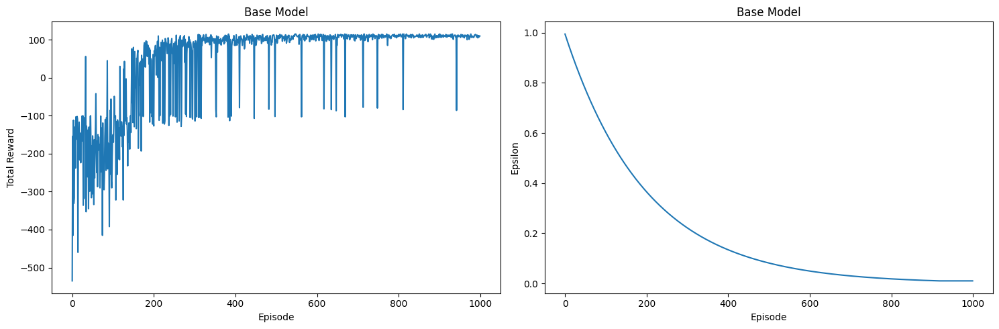


QTable after training:
{(2, 5, 0): array([-1.77529619, 98.26446026, -1.19277238, -1.88743153, -7.86342837,
       -7.42557231]), (2, 4, 0): array([ -2.01187873, -65.01530377, 110.20668911,   2.34534144,
        -5.13526388,  -3.22720776]), (3, 5, 0): array([-2.28689583, -1.82565563, 54.00885916, -2.51007513, -9.69867585,
       -9.34156759]), (3, 4, 0): array([ 3.94943655e-02, -8.60547260e+01,  8.45228217e+01, -2.05332372e+00,
       -9.01196969e+00, -6.41020918e+00]), (1, 4, 0): array([  0.62038176, 116.14119837,   0.57953338,  11.98193494,
         3.35434947,  -0.49519485]), (1, 5, 0): array([-1.38240445, 88.55809417, -1.88041222, -1.41114541, -9.96986664,
       -8.94567534]), (0, 5, 0): array([-0.42756642, 71.16875597, -1.62624106, -1.71705671, -9.18012911,
       -9.61244341]), (0, 4, 0): array([ -1.49926586, 101.9147853 ,  -0.67005349,   2.22994977,
        -8.23457663,   1.39255567]), (1, 3, 0): array([  3.39633525, 122.3831124 ,   1.96073081, -46.06434764,
        10.73532266

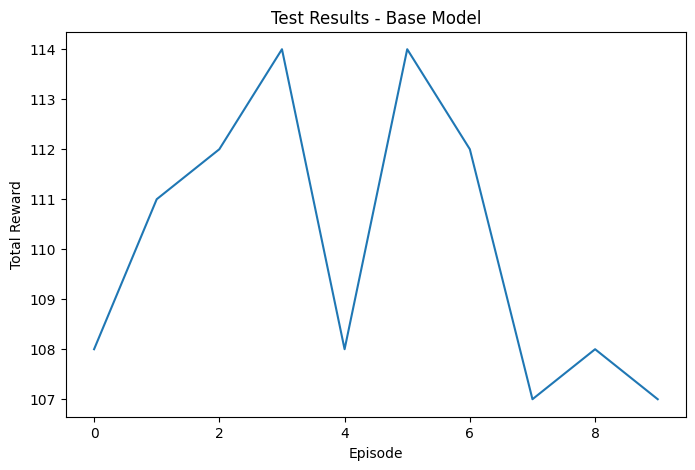


Running the agent with renfering for 1 ep:


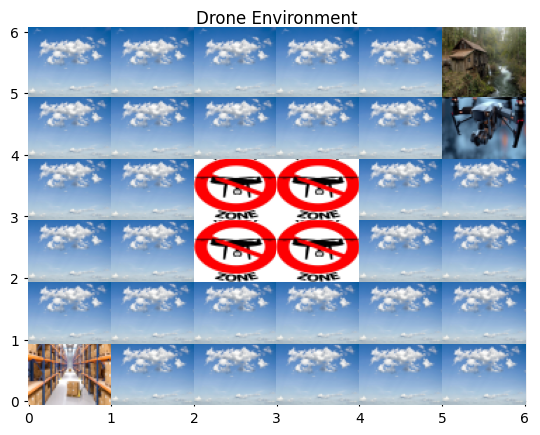

'state': (5, 4, 0),'action': 1, 'reward' : -1


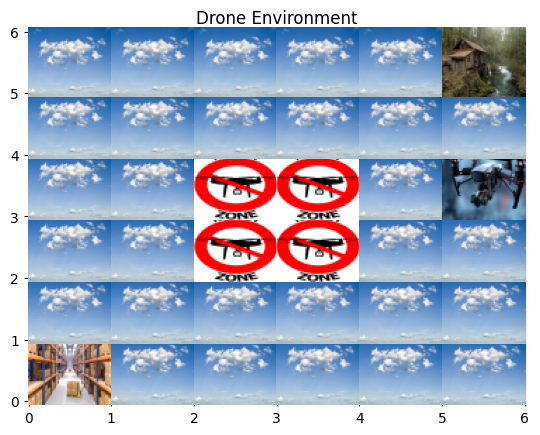

'state': (5, 3, 0),'action': 2, 'reward' : -1


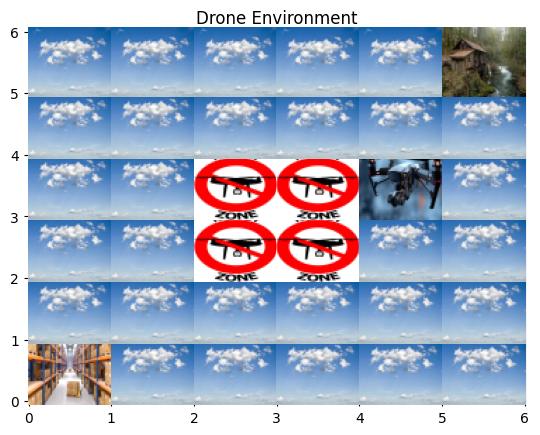

'state': (4, 3, 0),'action': 1, 'reward' : -1


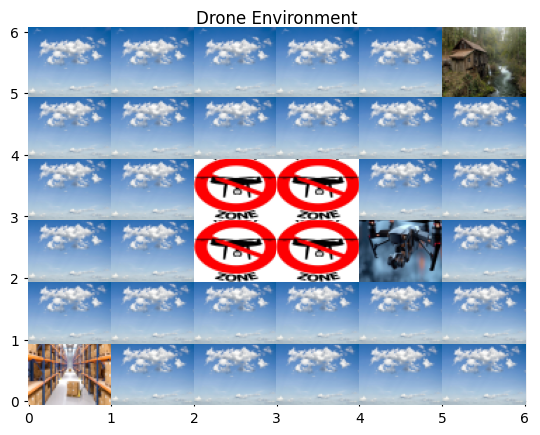

'state': (4, 2, 0),'action': 1, 'reward' : -1


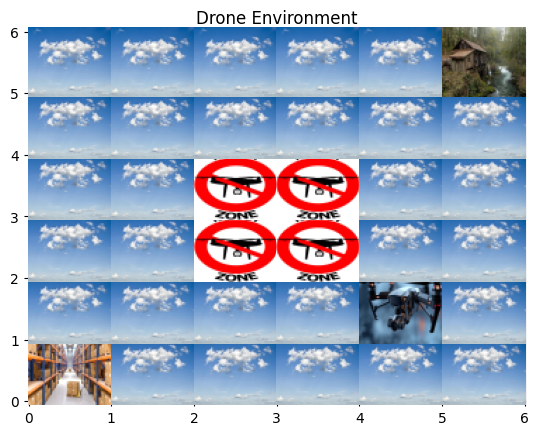

'state': (4, 1, 0),'action': 2, 'reward' : -1


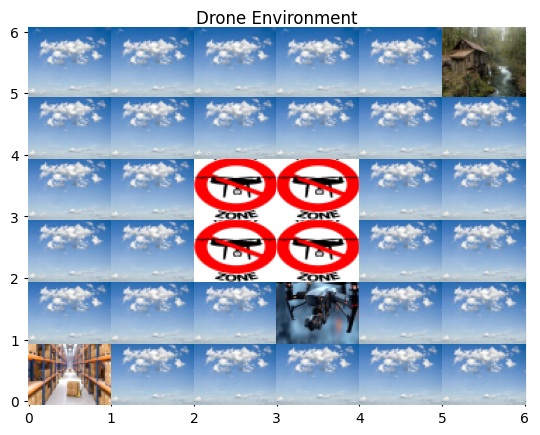

'state': (3, 1, 0),'action': 2, 'reward' : -1


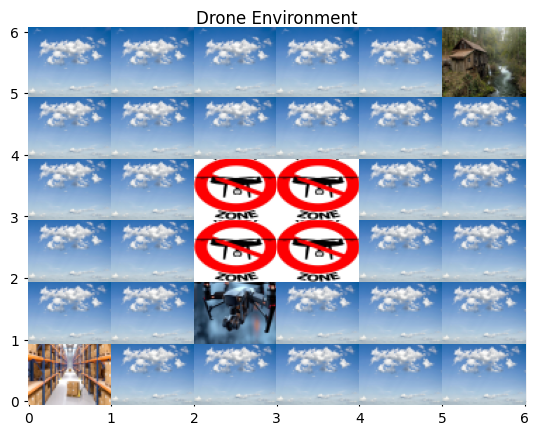

'state': (2, 1, 0),'action': 2, 'reward' : -1


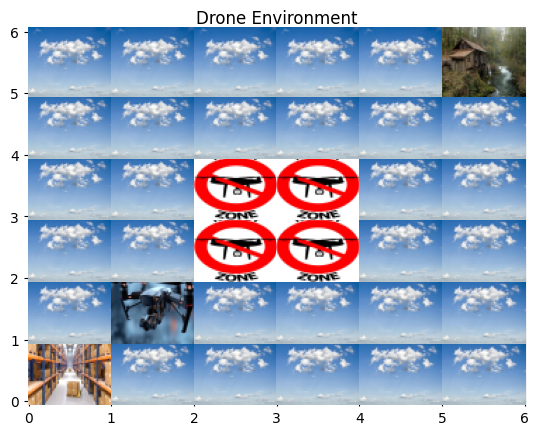

'state': (1, 1, 0),'action': 1, 'reward' : -1


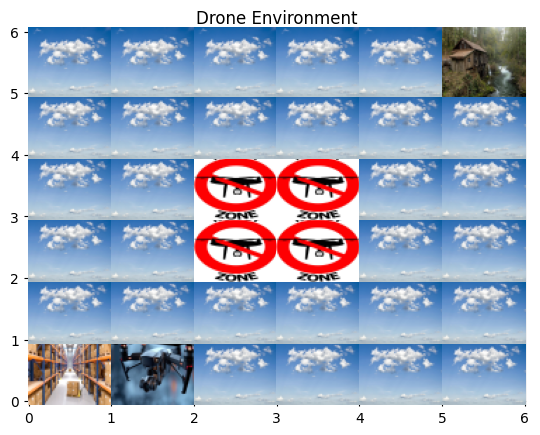

'state': (1, 0, 0),'action': 2, 'reward' : -1


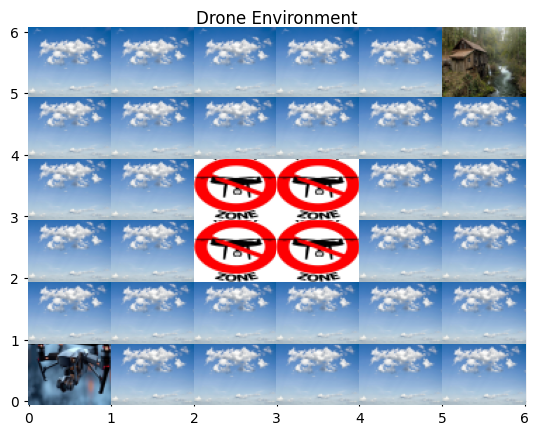

'state': (0, 0, 0),'action': 4, 'reward' : 25


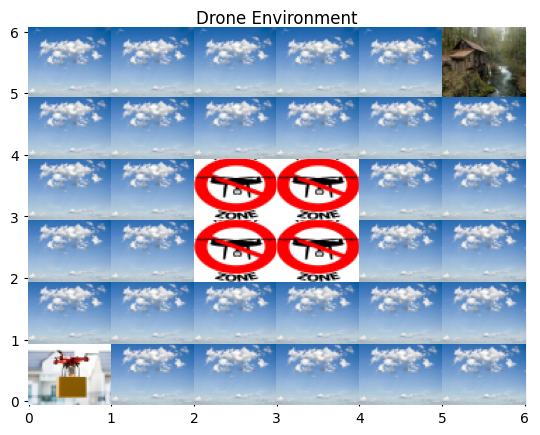

'state': (0, 0, 1),'action': 0, 'reward' : -1


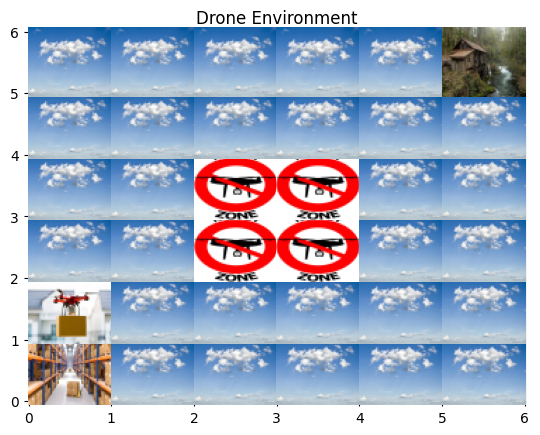

'state': (0, 1, 1),'action': 0, 'reward' : -1


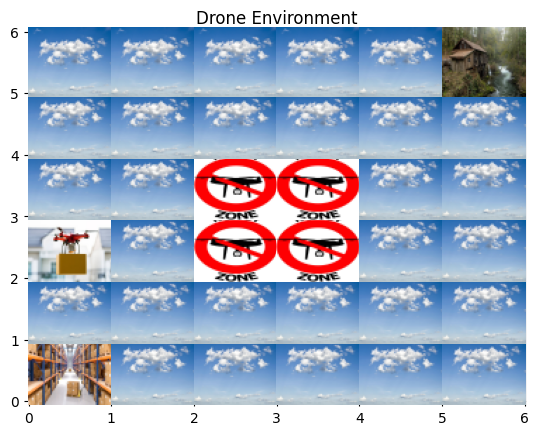

'state': (0, 2, 1),'action': 3, 'reward' : -1


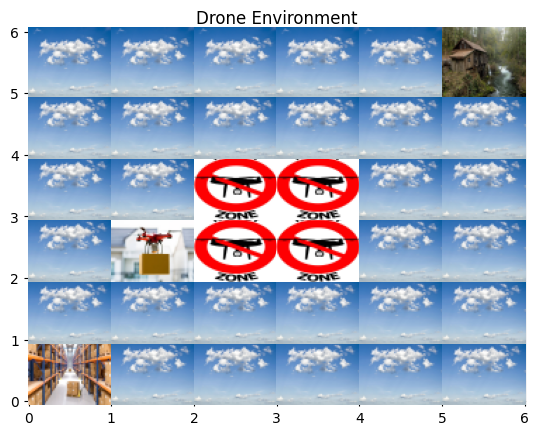

'state': (1, 2, 1),'action': 0, 'reward' : -1


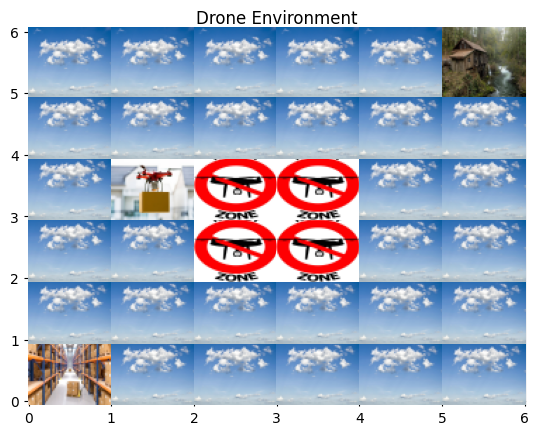

'state': (1, 3, 1),'action': 0, 'reward' : -1


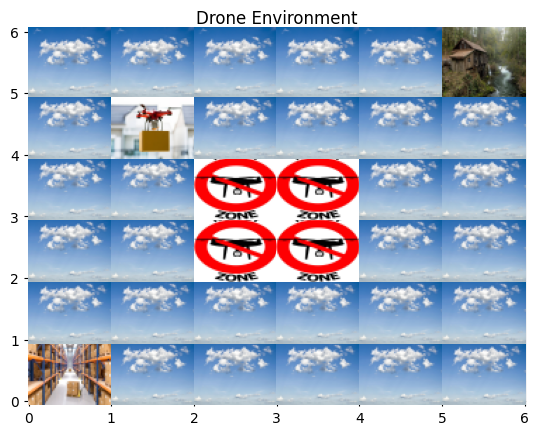

'state': (1, 4, 1),'action': 0, 'reward' : -1


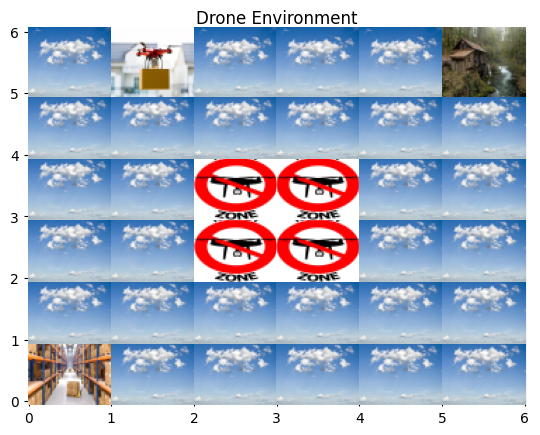

'state': (1, 5, 1),'action': 3, 'reward' : -1


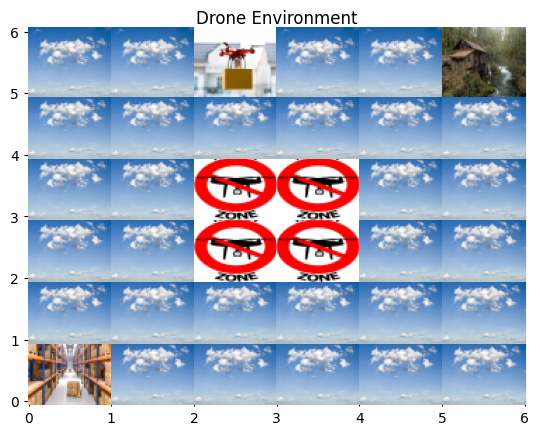

'state': (2, 5, 1),'action': 3, 'reward' : -1


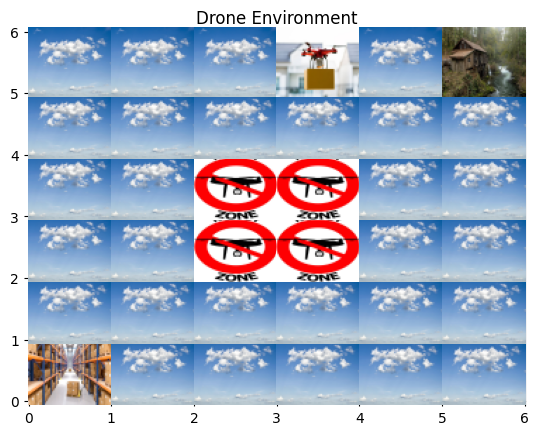

'state': (3, 5, 1),'action': 3, 'reward' : -1


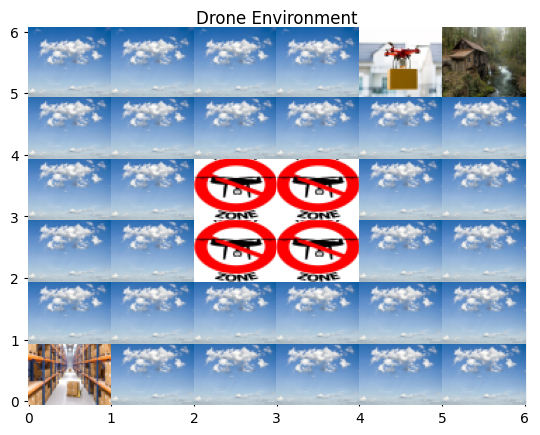

'state': (4, 5, 1),'action': 3, 'reward' : -1


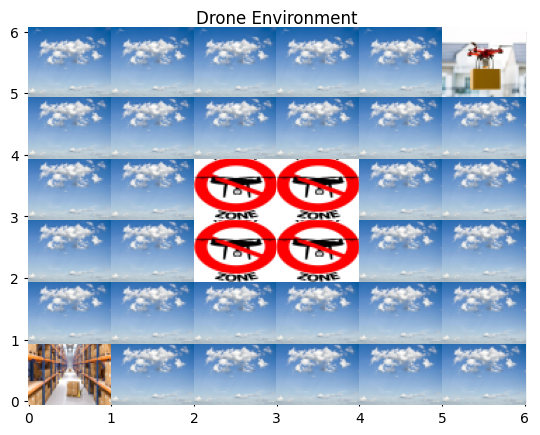

'state': (5, 5, 1),'action': 5, 'reward' : 100

Now let us perform hyper parmeter tuning by using different gamma and epsilon values

Training with discount=0.8
'state': (4, 5, 0),'action': 1, 'reward' : -1
'state': (4, 4, 0),'action': 1, 'reward' : -1
'state': (4, 3, 0),'action': 1, 'reward' : -1
'state': (4, 2, 0),'action': 1, 'reward' : -1
'state': (4, 1, 0),'action': 2, 'reward' : -1
'state': (3, 1, 0),'action': 1, 'reward' : -1
'state': (3, 0, 0),'action': 2, 'reward' : -1
'state': (2, 0, 0),'action': 2, 'reward' : -1
'state': (1, 0, 0),'action': 2, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 0, 'reward' : -1
'state': (0, 1, 1),'action': 0, 'reward' : -1
'state': (0, 2, 1),'action': 0, 'reward' : -1
'state': (0, 3, 1),'action': 0, 'reward' : -1
'state': (0, 4, 1),'action': 3, 'reward' : -1
'state': (1, 4, 1),'action': 3, 'reward' : -1
'state': (2, 4, 1),'action': 0, 'reward' : -1
'state': (2, 5, 1),'action': 3, 'reward' : -1
'state': (3

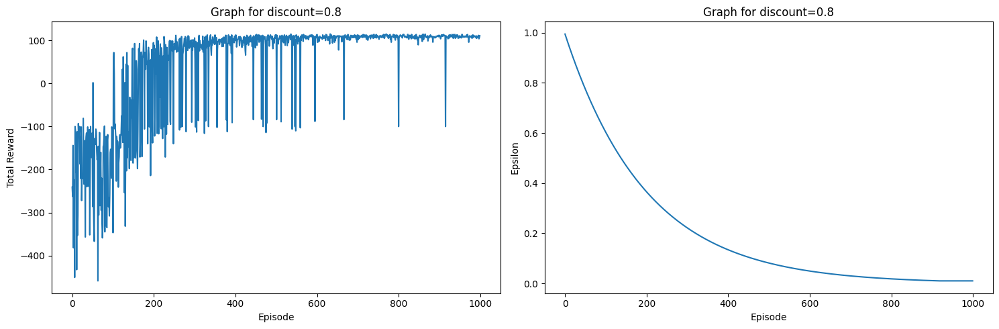

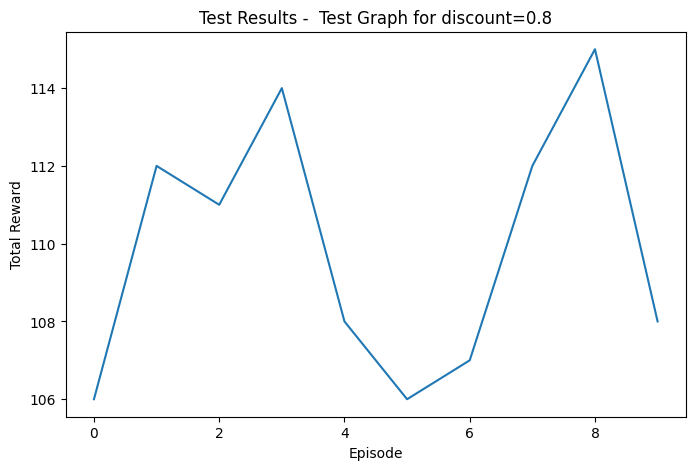


Training with discount=0.9
'state': (5, 0, 0),'action': 2, 'reward' : -1
'state': (4, 0, 0),'action': 2, 'reward' : -1
'state': (3, 0, 0),'action': 2, 'reward' : -1
'state': (2, 0, 0),'action': 2, 'reward' : -1
'state': (1, 0, 0),'action': 2, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, 'reward' : -1
'state': (1, 0, 1),'action': 3, 'reward' : -1
'state': (2, 0, 1),'action': 3, 'reward' : -1
'state': (3, 0, 1),'action': 3, 'reward' : -1
'state': (4, 0, 1),'action': 0, 'reward' : -1
'state': (4, 1, 1),'action': 3, 'reward' : -1
'state': (5, 1, 1),'action': 0, 'reward' : -1
'state': (5, 2, 1),'action': 0, 'reward' : -1
'state': (5, 3, 1),'action': 0, 'reward' : -1
'state': (5, 4, 1),'action': 0, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (5, 2, 0),'action': 2, 'reward' : -1
'state': (4, 2, 0),'action': 1, 'reward' : -1
'state': (4, 1, 0),'action': 2, 'reward' : -1
'state': (3, 1, 0),'action': 2, 'reward' : -1
'stat

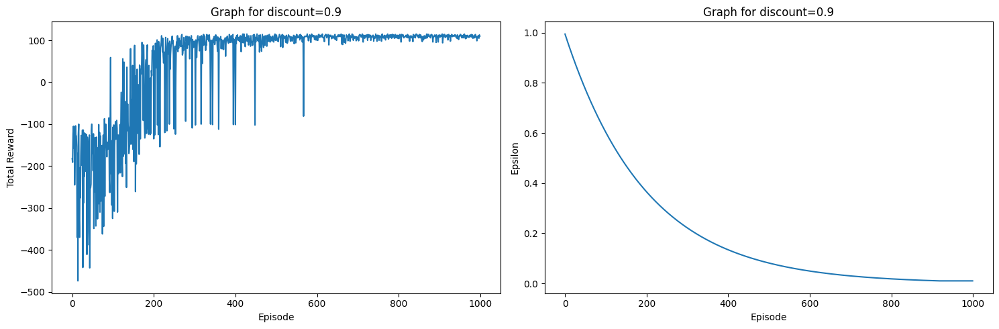

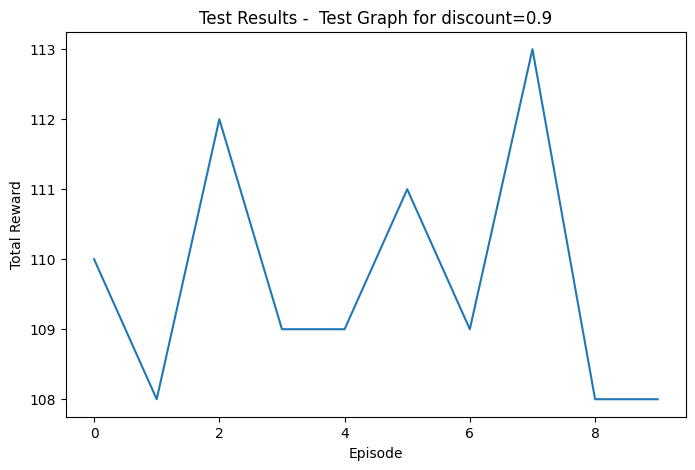


Training with discount=0.95
'state': (1, 4, 0),'action': 1, 'reward' : -1
'state': (1, 3, 0),'action': 1, 'reward' : -1
'state': (1, 2, 0),'action': 1, 'reward' : -1
'state': (1, 1, 0),'action': 1, 'reward' : -1
'state': (1, 0, 0),'action': 2, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, 'reward' : -1
'state': (1, 0, 1),'action': 3, 'reward' : -1
'state': (2, 0, 1),'action': 3, 'reward' : -1
'state': (3, 0, 1),'action': 0, 'reward' : -1
'state': (3, 1, 1),'action': 3, 'reward' : -1
'state': (4, 1, 1),'action': 0, 'reward' : -1
'state': (4, 2, 1),'action': 3, 'reward' : -1
'state': (5, 2, 1),'action': 0, 'reward' : -1
'state': (5, 3, 1),'action': 0, 'reward' : -1
'state': (5, 4, 1),'action': 0, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (3, 4, 0),'action': 2, 'reward' : -1
'state': (2, 4, 0),'action': 2, 'reward' : -1
'state': (1, 4, 0),'action': 1, 'reward' : -1
'state': (1, 3, 0),'action': 1, 'reward' : -1
'sta

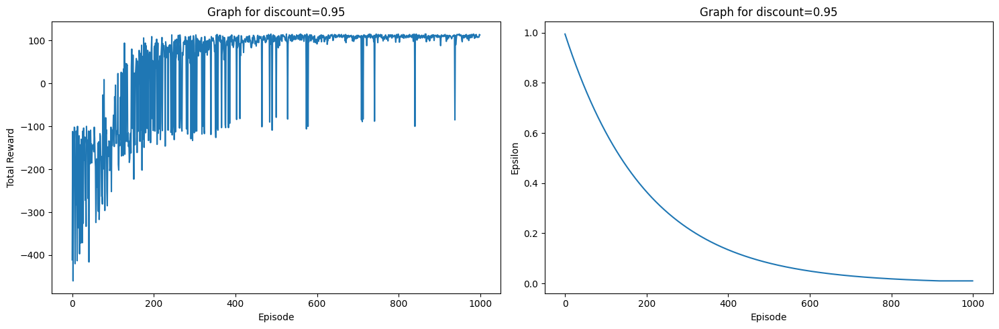

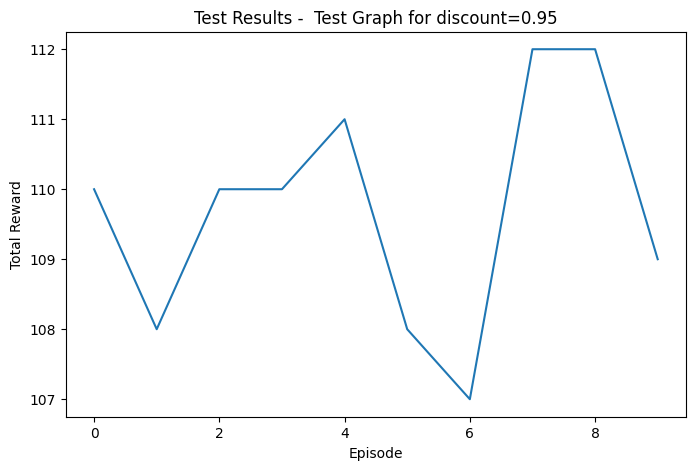


Training with discount=0.99
'state': (2, 5, 0),'action': 1, 'reward' : -1
'state': (2, 4, 0),'action': 2, 'reward' : -1
'state': (1, 4, 0),'action': 1, 'reward' : -1
'state': (1, 3, 0),'action': 1, 'reward' : -1
'state': (1, 2, 0),'action': 2, 'reward' : -1
'state': (0, 2, 0),'action': 1, 'reward' : -1
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, 'reward' : -1
'state': (1, 0, 1),'action': 0, 'reward' : -1
'state': (1, 1, 1),'action': 0, 'reward' : -1
'state': (1, 2, 1),'action': 0, 'reward' : -1
'state': (1, 3, 1),'action': 0, 'reward' : -1
'state': (1, 4, 1),'action': 3, 'reward' : -1
'state': (2, 4, 1),'action': 3, 'reward' : -1
'state': (3, 4, 1),'action': 3, 'reward' : -1
'state': (4, 4, 1),'action': 0, 'reward' : -1
'state': (4, 5, 1),'action': 3, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (0, 4, 0),'action': 1, 'reward' : -1
'state': (0, 3, 0),'action': 1, 'reward' : -1
'sta

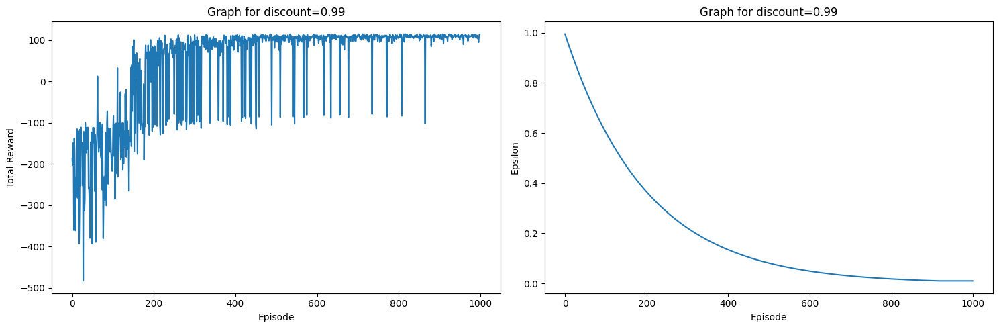

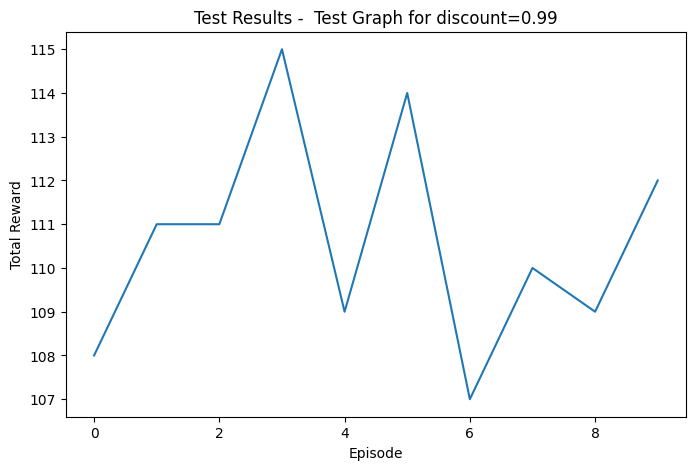


Training with epsilon_decay=0.8
'state': (1, 4, 0),'action': 2, 'reward' : -1
'state': (0, 4, 0),'action': 1, 'reward' : -1
'state': (0, 3, 0),'action': 1, 'reward' : -1
'state': (0, 2, 0),'action': 1, 'reward' : -1
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 0, 'reward' : -1
'state': (0, 1, 1),'action': 0, 'reward' : -1
'state': (0, 2, 1),'action': 3, 'reward' : -1
'state': (1, 2, 1),'action': 0, 'reward' : -1
'state': (1, 3, 1),'action': 0, 'reward' : -1
'state': (1, 4, 1),'action': 3, 'reward' : -1
'state': (2, 4, 1),'action': 0, 'reward' : -1
'state': (2, 5, 1),'action': 3, 'reward' : -1
'state': (3, 5, 1),'action': 3, 'reward' : -1
'state': (4, 5, 1),'action': 3, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (1, 2, 0),'action': 1, 'reward' : -1
'state': (1, 1, 0),'action': 2, 'reward' : -1
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25


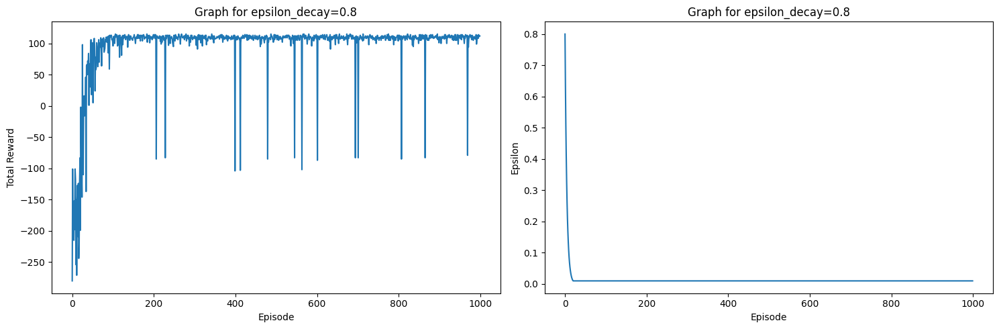

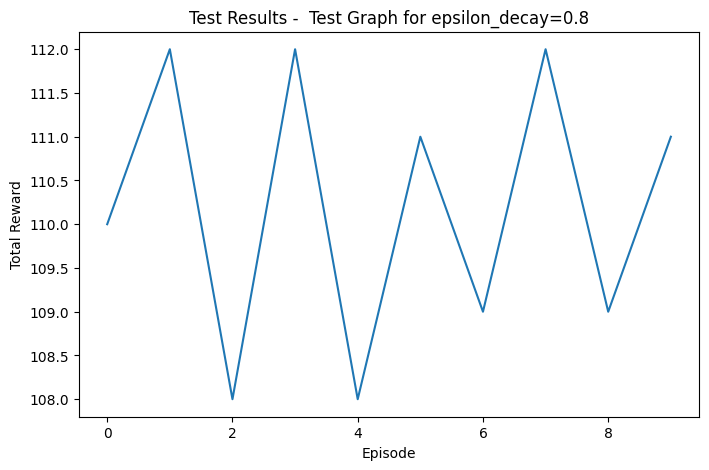


Training with epsilon_decay=0.99
'state': (3, 4, 0),'action': 2, 'reward' : -1
'state': (2, 4, 0),'action': 2, 'reward' : -1
'state': (1, 4, 0),'action': 1, 'reward' : -1
'state': (1, 3, 0),'action': 2, 'reward' : -1
'state': (0, 3, 0),'action': 1, 'reward' : -1
'state': (0, 2, 0),'action': 1, 'reward' : -1
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, 'reward' : -1
'state': (1, 0, 1),'action': 0, 'reward' : -1
'state': (1, 1, 1),'action': 3, 'reward' : -1
'state': (2, 1, 1),'action': 3, 'reward' : -1
'state': (3, 1, 1),'action': 3, 'reward' : -1
'state': (4, 1, 1),'action': 3, 'reward' : -1
'state': (5, 1, 1),'action': 0, 'reward' : -1
'state': (5, 2, 1),'action': 0, 'reward' : -1
'state': (5, 3, 1),'action': 0, 'reward' : -1
'state': (5, 4, 1),'action': 0, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (4, 4, 0),'action': 1, 'reward' : -1
'state': (4, 3, 0),'action': 1, 'reward' : -1

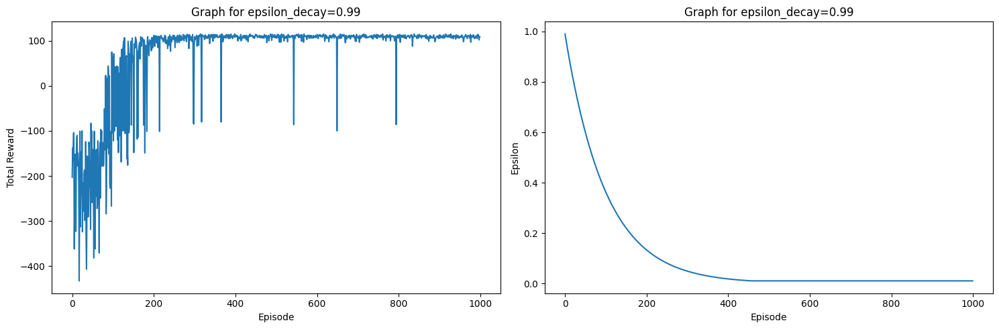

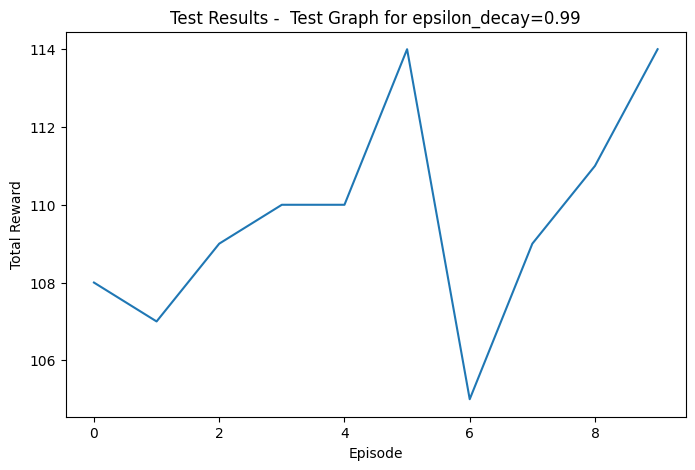


Training with epsilon_decay=0.995
'state': (4, 1, 0),'action': 2, 'reward' : -1
'state': (3, 1, 0),'action': 2, 'reward' : -1
'state': (2, 1, 0),'action': 2, 'reward' : -1
'state': (1, 1, 0),'action': 2, 'reward' : -1
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 0, 'reward' : -1
'state': (0, 1, 1),'action': 0, 'reward' : -1
'state': (0, 2, 1),'action': 3, 'reward' : -1
'state': (1, 2, 1),'action': 0, 'reward' : -1
'state': (1, 3, 1),'action': 0, 'reward' : -1
'state': (1, 4, 1),'action': 0, 'reward' : -1
'state': (1, 5, 1),'action': 3, 'reward' : -1
'state': (2, 5, 1),'action': 3, 'reward' : -1
'state': (3, 5, 1),'action': 3, 'reward' : -1
'state': (4, 5, 1),'action': 3, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (4, 1, 0),'action': 2, 'reward' : -1
'state': (3, 1, 0),'action': 2, 'reward' : -1
'state': (2, 1, 0),'action': 2, 'reward' : -1
'state': (1, 1, 0),'action': 2, 'reward' : -

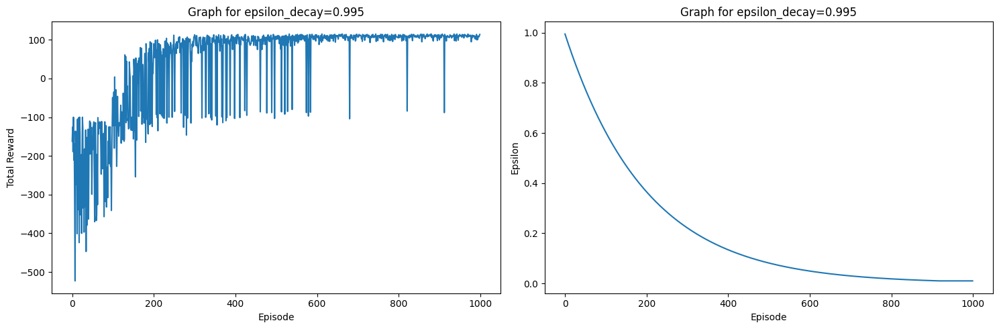

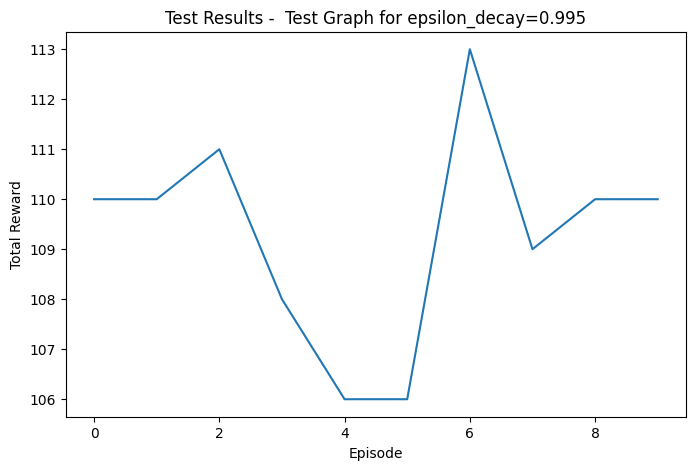


Training with epsilon_decay=0.999
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, 'reward' : -1
'state': (1, 0, 1),'action': 3, 'reward' : -1
'state': (2, 0, 1),'action': 3, 'reward' : -1
'state': (3, 0, 1),'action': 3, 'reward' : -1
'state': (4, 0, 1),'action': 0, 'reward' : -1
'state': (4, 1, 1),'action': 0, 'reward' : -1
'state': (4, 2, 1),'action': 3, 'reward' : -1
'state': (5, 2, 1),'action': 0, 'reward' : -1
'state': (5, 3, 1),'action': 0, 'reward' : -1
'state': (5, 4, 1),'action': 0, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (4, 2, 0),'action': 1, 'reward' : -1
'state': (4, 1, 0),'action': 1, 'reward' : -1
'state': (4, 0, 0),'action': 2, 'reward' : -1
'state': (3, 0, 0),'action': 2, 'reward' : -1
'state': (2, 0, 0),'action': 2, 'reward' : -1
'state': (1, 0, 0),'action': 2, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, 'reward' : -

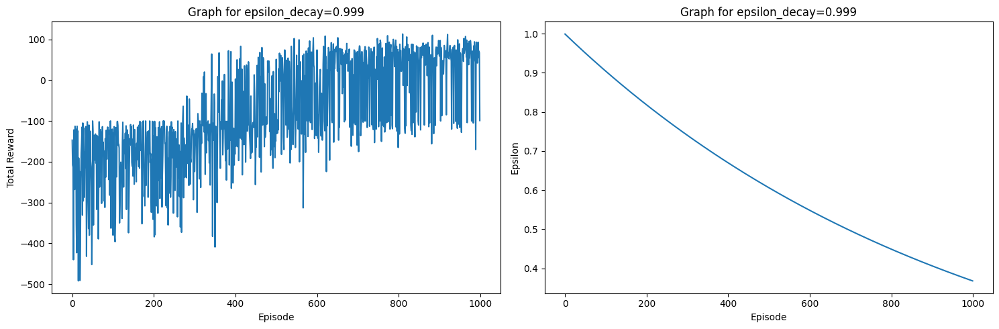

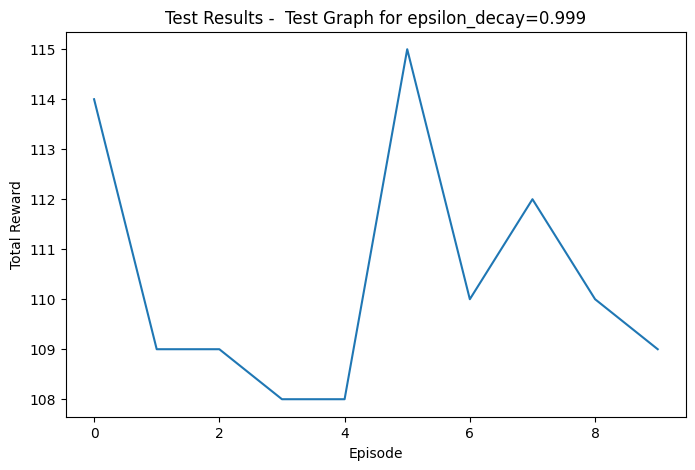

In [60]:
env = AutoDrone()
print("\nFirst base model without tuning the parameters")
agent1 = AgentQlearn(env)
print("Initial Qtable:")
print(agent1.qTable)
rewards, epsilons = agent1.train()
plot_train(rewards, epsilons, "Base Model")
print("\nQTable after training:")
print(agent1.qTable)

test_rewards, _ = agent1.test(eps=10)
plot_test(test_rewards, "Base Model")

print("\nRunning the agent with renfering for 1 ep:")
_, ep_info = agent1.test(eps=1, render=True)

print("\nNow let us perform hyper parmeter tuning by using different gamma and epsilon values")
discount_trials = [0.8, 0.9, 0.95, 0.99]
hyperparameterTuning(env, "discount", discount_trials)
epsilon_trials = [0.8, 0.99, 0.995, 0.999]
hyperparameterTuning(env, "epsilon_decay", epsilon_trials)


From the above plots we can see that the best parameters for gamma is 
Gamma is : 0.9
Epsilon decay rate is : 0.8

Training final model with best parameters


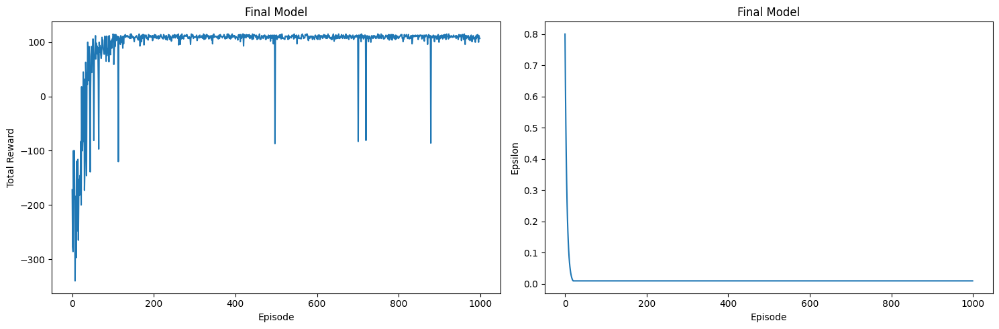

'state': (1, 4, 0),'action': 2, 'reward' : -1
'state': (0, 4, 0),'action': 1, 'reward' : -1
'state': (0, 3, 0),'action': 1, 'reward' : -1
'state': (0, 2, 0),'action': 1, 'reward' : -1
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, 'reward' : -1
'state': (1, 0, 1),'action': 3, 'reward' : -1
'state': (2, 0, 1),'action': 0, 'reward' : -1
'state': (2, 1, 1),'action': 3, 'reward' : -1
'state': (3, 1, 1),'action': 3, 'reward' : -1
'state': (4, 1, 1),'action': 0, 'reward' : -1
'state': (4, 2, 1),'action': 3, 'reward' : -1
'state': (5, 2, 1),'action': 0, 'reward' : -1
'state': (5, 3, 1),'action': 0, 'reward' : -1
'state': (5, 4, 1),'action': 0, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (2, 1, 0),'action': 1, 'reward' : -1
'state': (2, 0, 0),'action': 2, 'reward' : -1
'state': (1, 0, 0),'action': 2, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, '

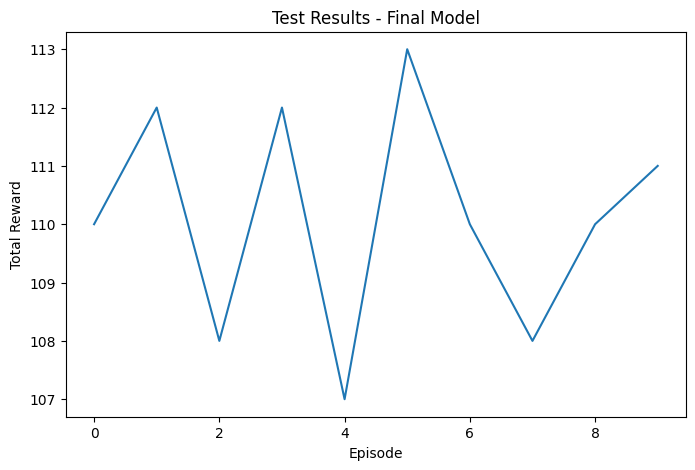


Running the agent with renfering for 1 ep:


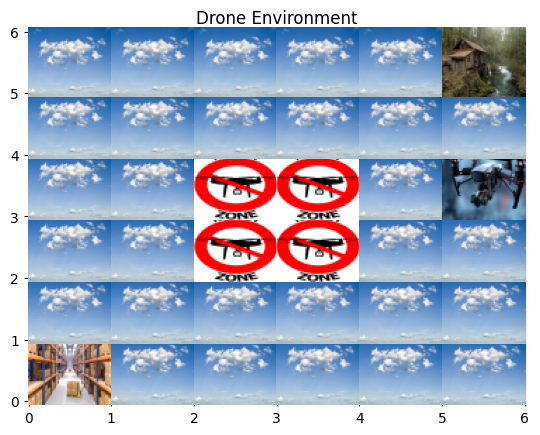

'state': (5, 3, 0),'action': 2, 'reward' : -1


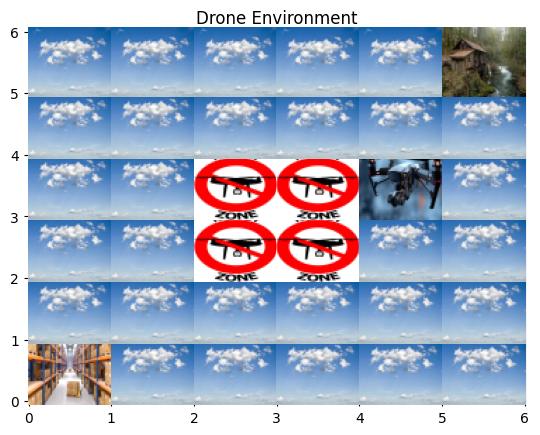

'state': (4, 3, 0),'action': 1, 'reward' : -1


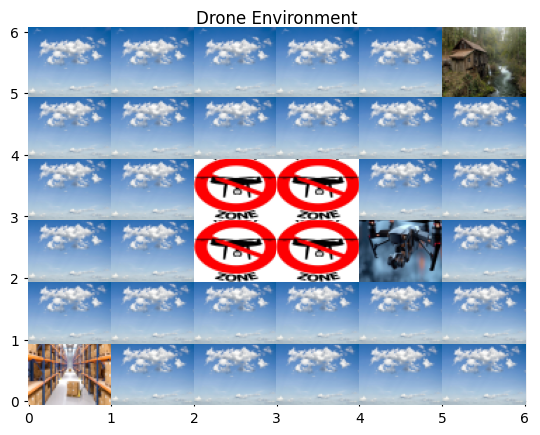

'state': (4, 2, 0),'action': 1, 'reward' : -1


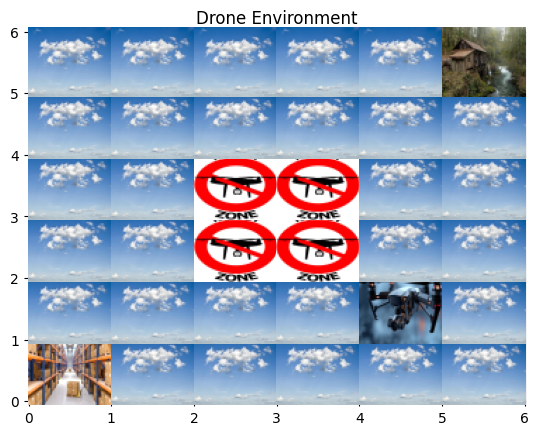

'state': (4, 1, 0),'action': 1, 'reward' : -1


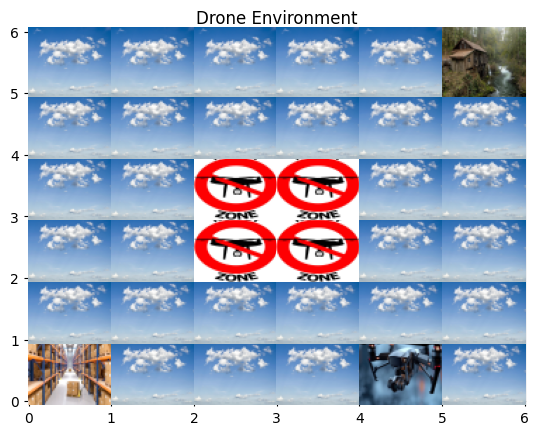

'state': (4, 0, 0),'action': 2, 'reward' : -1


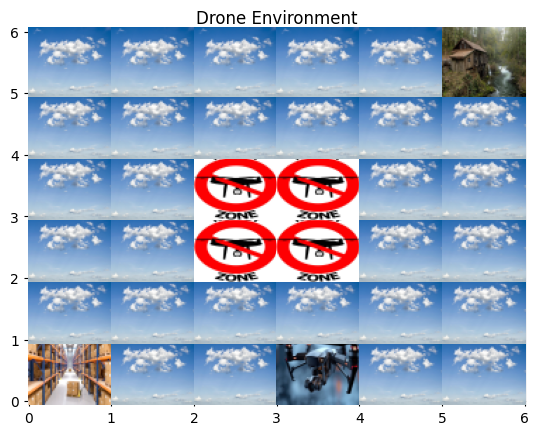

'state': (3, 0, 0),'action': 2, 'reward' : -1


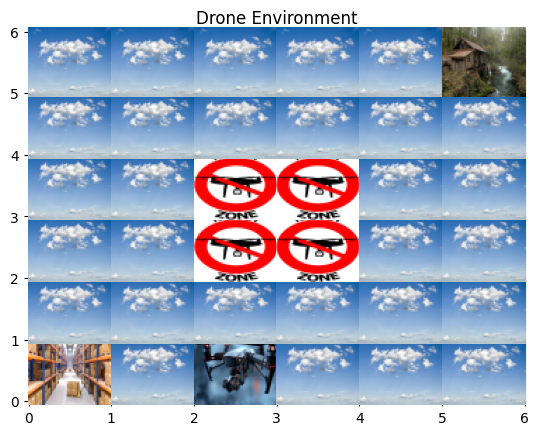

'state': (2, 0, 0),'action': 2, 'reward' : -1


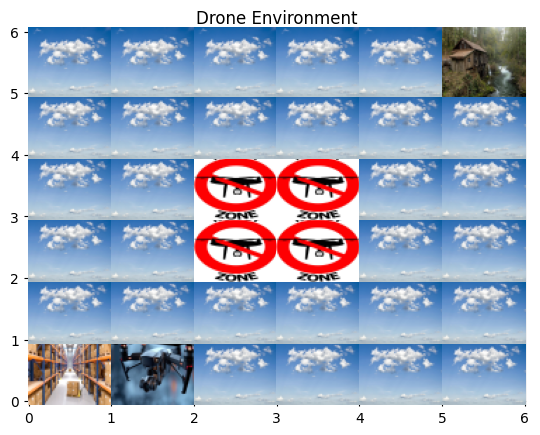

'state': (1, 0, 0),'action': 2, 'reward' : -1


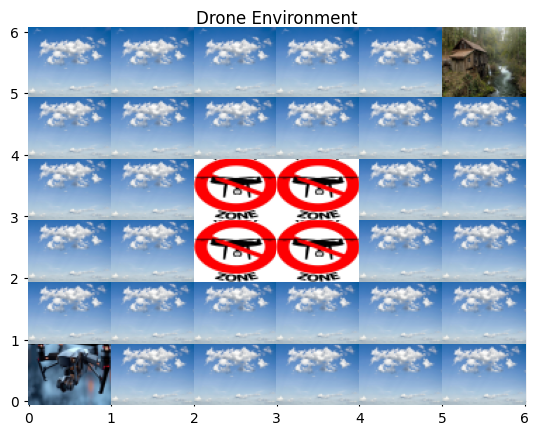

'state': (0, 0, 0),'action': 4, 'reward' : 25


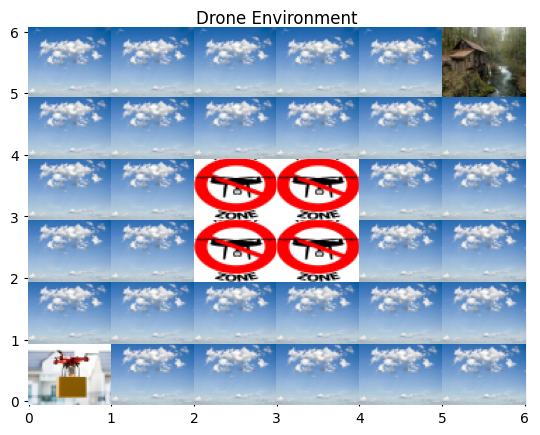

'state': (0, 0, 1),'action': 3, 'reward' : -1


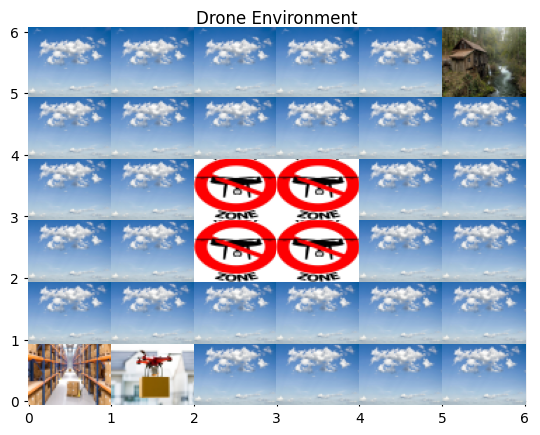

'state': (1, 0, 1),'action': 3, 'reward' : -1


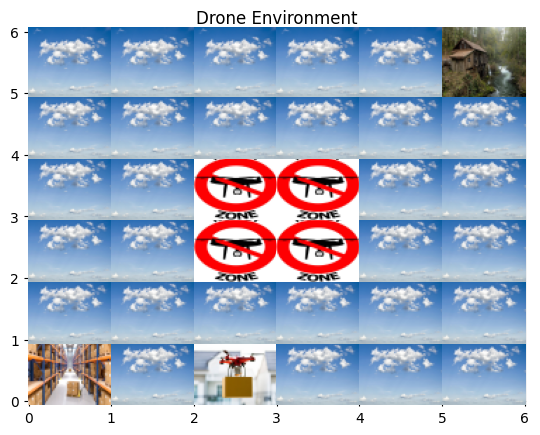

'state': (2, 0, 1),'action': 0, 'reward' : -1


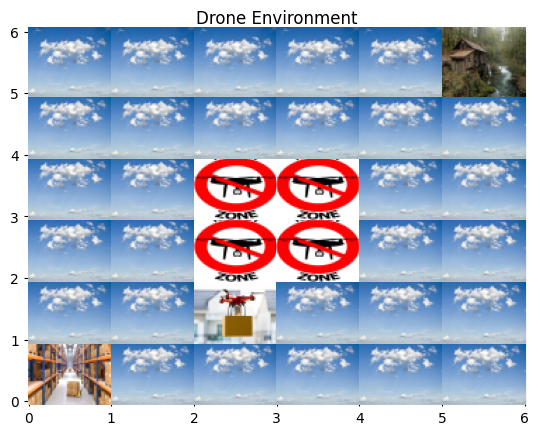

'state': (2, 1, 1),'action': 3, 'reward' : -1


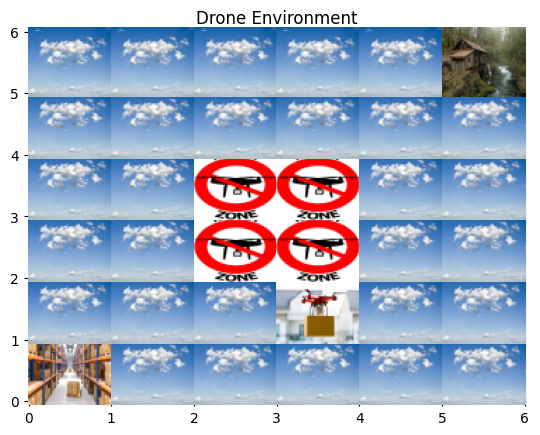

'state': (3, 1, 1),'action': 3, 'reward' : -1


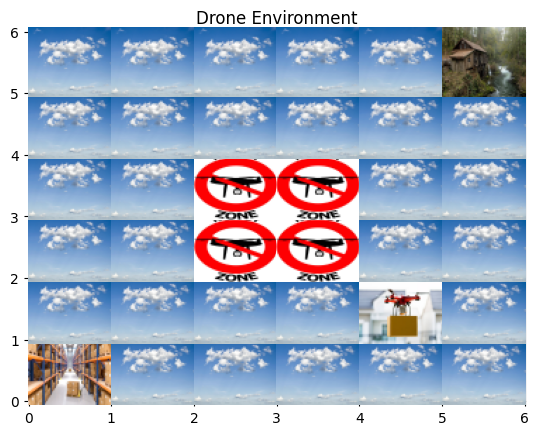

'state': (4, 1, 1),'action': 0, 'reward' : -1


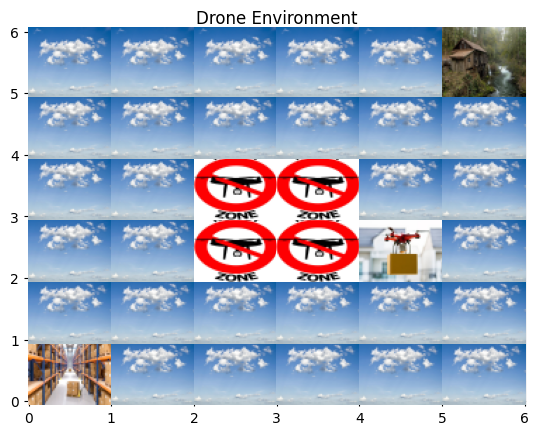

'state': (4, 2, 1),'action': 3, 'reward' : -1


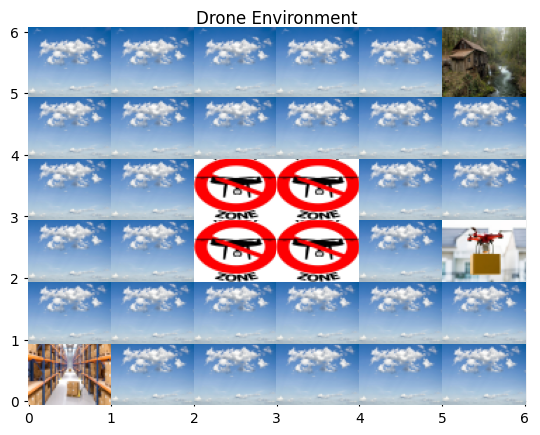

'state': (5, 2, 1),'action': 0, 'reward' : -1


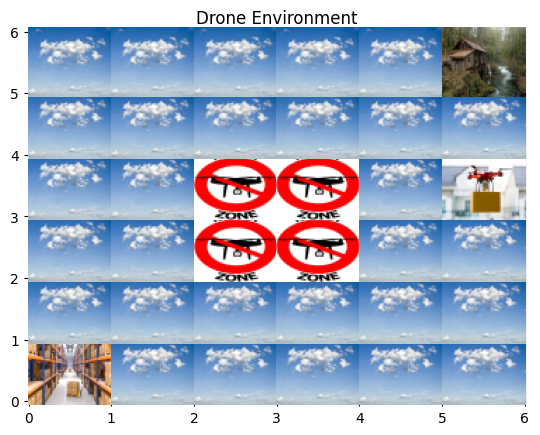

'state': (5, 3, 1),'action': 0, 'reward' : -1


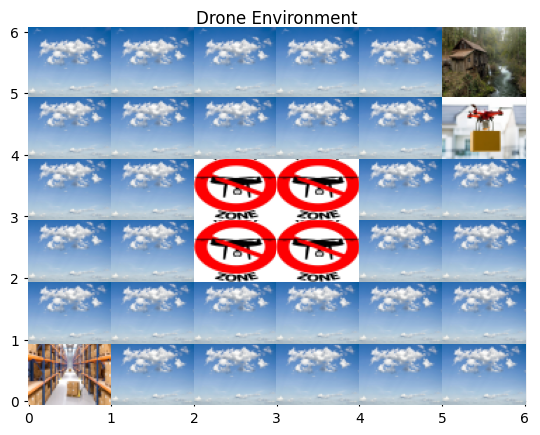

'state': (5, 4, 1),'action': 0, 'reward' : -1


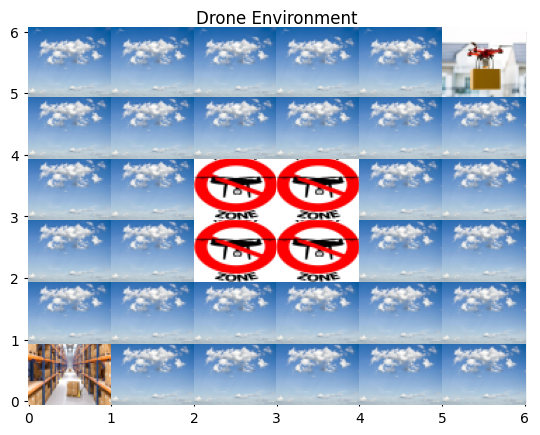

'state': (5, 5, 1),'action': 5, 'reward' : 100

Final model performance summary:
Average evaluation reward: 110.10
Standard deviation: 1.87
Best episode reward: 113.00
Worst episode reward: 107.00


In [61]:
print(f"\nFrom the above plots we can see that the best parameters for gamma is ")
print(f"Gamma is : 0.9")
print(f"Epsilon decay rate is : 0.8")

print("\nTraining final model with best parameters")
final_agent = AgentQlearn(env, discount=0.9, epsilon_decay=0.8)
final_rewards_det_qlearn, final_epsilons = final_agent.train()

with open('qlearning_qtable_det.pkl', 'wb') as f:
    pickle.dump(final_agent.qTable, f)

plot_train(final_rewards_det_qlearn, final_epsilons, "Final Model")
final_test_rewards, final_renders = final_agent.test(eps=10)
plot_test(final_test_rewards, "Final Model")

print("\nRunning the agent with renfering for 1 ep:")
_, ep_info = final_agent.test(eps=1, render=True)

print("\nFinal model performance summary:")
print(f"Average evaluation reward: {np.mean(final_test_rewards):.2f}")
print(f"Standard deviation: {np.std(final_test_rewards):.2f}")
print(f"Best episode reward: {max(final_test_rewards):.2f}")
print(f"Worst episode reward: {min(final_test_rewards):.2f}")

In [62]:
#SARSA

In [63]:
class SARSAAgent:
    def __init__(self, env, lr=0.1, discount=0.95, epsilon=1.0, epsilon_decay=0.99, epsilon_min=0.01):
        self.env = env
        self.lr = lr
        self.discount = discount
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min
        self.qTable = {}
        self.initialTable = None
    
    def action_selection(self, state, training=True):
        if state not in self.qTable:
            self.qTable[state] = np.zeros(self.env.action_space.n)
        
        if training and random.random() < self.epsilon:
            return self.env.action_space.sample()                        #providing a random action for exploration
        return np.argmax(self.qTable[state])                            # greedy way of selecting maximum q value action
    
    def train(self, eps=1000, max_steps=100):
        self.initialTable = self.qTable.copy()
        log_reward = []
        log_epsilon = []
        
        for episode in range(eps):
            state, _ = self.env.reset()
            total_reward = 0   
            # Get first action using epsilon-greedy
            action = self.action_selection(state)
            
            for step in range(max_steps):
                # Take action and observe next state and reward
                next_state, reward, ep_end, _, _ = self.env.step(action)
                
                # Initialize Q-value for next state if needed
                if next_state not in self.qTable:
                    self.qTable[next_state] = np.zeros(self.env.action_space.n)
                next_action = self.action_selection(next_state)                                    #key line in SARSA, We actually use the q value of next action that is taken instead of simply using next action that gives max q value
                old_val = self.qTable[state][action]
                next_val = self.qTable[next_state][next_action]  # Use actual next action instead of max which is the diff from q learing formula if you compare with SARSA
                new_val = old_val + self.lr * (reward + self.discount * next_val - old_val)
                self.qTable[state][action] = new_val
                state = next_state
                action = next_action
                total_reward += reward  
                if ep_end:
                    break
            
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
            log_reward.append(total_reward)
            log_epsilon.append(self.epsilon)
            
        return log_reward, log_epsilon
    
    def test(self, eps=10, render=False):
        test_reward = []
        ep_info = []
        
        for episode in range(eps):
            state, _ = self.env.reset()
            total_reward = 0
            episode_states = []  
            while True:
                action = self.action_selection(state, training=False)
                if render:
                    episode_states.append({'state': state,'action': action,'grid': self.env.render()})
                
                next_state, reward, ep_end, _, _ = self.env.step(action)
                print(f"'state': {state},'action': {action}, 'reward' : {reward}")
                total_reward += reward
                state = next_state
                
                if ep_end:
                    break
            
            test_reward.append(total_reward)
            if render:
                ep_info.append(episode_states)
        
        return test_reward, ep_info


Initial Qtable:
{}

Trained Qtable:
{(5, 2, 0): array([-5.35370152, 40.68226551, -1.08321976, -5.52332752, -8.22182043,
       -9.67816258]), (4, 2, 0): array([ -4.42237254,  32.94424799, -71.75134709,  -4.17351307,
        -6.26000383, -12.46622049]), (4, 1, 0): array([-6.66996954, -3.0716145 , 47.00240777, -3.23796697, -6.30143248,
       -7.46053699]), (3, 1, 0): array([-40.81951183,  51.72159529,  -4.15324841,  -3.15896928,
         0.40100256,  -8.46442187]), (2, 1, 0): array([-55.72687112,  53.7227604 ,  -0.94232782,  -1.17786163,
        -7.85349749,  -9.03022656]), (1, 1, 0): array([-0.45276744, -0.92295051, 54.44002283, -1.28819501, -7.01420552,
       -3.42433841]), (3, 0, 0): array([ 1.70123396, -1.68892034, 58.17792497,  3.25909994, -5.20961782,
       -3.25188299]), (2, 0, 0): array([ 4.47338856,  9.93016311, 62.6313909 ,  4.75622151,  2.22283556,
        0.1829198 ]), (1, 0, 0): array([ 3.37223064,  1.04745401, 66.07023071,  7.34232503,  0.81686335,
        1.57174638]),

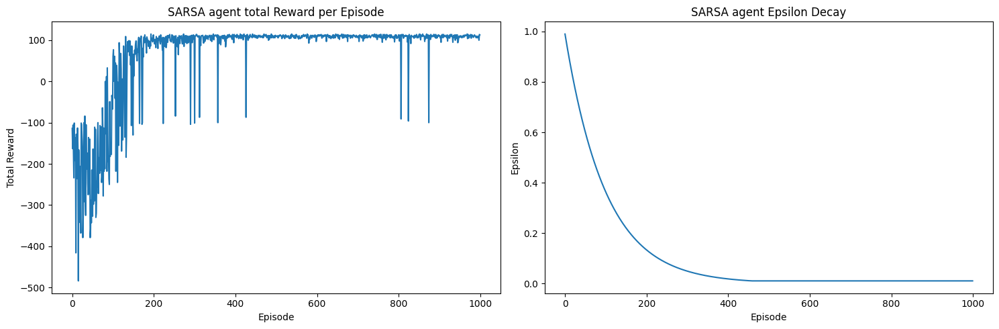

'state': (0, 4, 0),'action': 1, 'reward' : -1
'state': (0, 3, 0),'action': 1, 'reward' : -1
'state': (0, 2, 0),'action': 1, 'reward' : -1
'state': (0, 1, 0),'action': 1, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, 'reward' : -1
'state': (1, 0, 1),'action': 3, 'reward' : -1
'state': (2, 0, 1),'action': 3, 'reward' : -1
'state': (3, 0, 1),'action': 3, 'reward' : -1
'state': (4, 0, 1),'action': 0, 'reward' : -1
'state': (4, 1, 1),'action': 0, 'reward' : -1
'state': (4, 2, 1),'action': 3, 'reward' : -1
'state': (5, 2, 1),'action': 0, 'reward' : -1
'state': (5, 3, 1),'action': 0, 'reward' : -1
'state': (5, 4, 1),'action': 0, 'reward' : -1
'state': (5, 5, 1),'action': 5, 'reward' : 100
'state': (3, 0, 0),'action': 2, 'reward' : -1
'state': (2, 0, 0),'action': 2, 'reward' : -1
'state': (1, 0, 0),'action': 2, 'reward' : -1
'state': (0, 0, 0),'action': 4, 'reward' : 25
'state': (0, 0, 1),'action': 3, 'reward' : -1
'state': (1, 0, 1),'action': 3, '

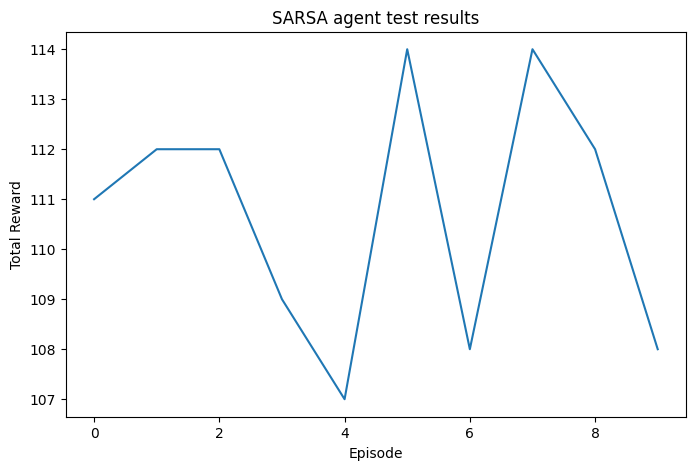

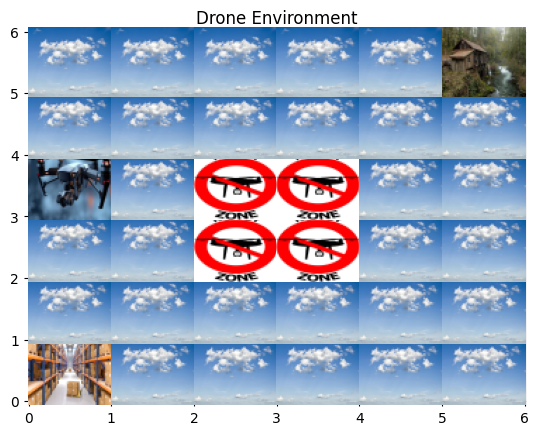

'state': (0, 3, 0),'action': 1, 'reward' : -1


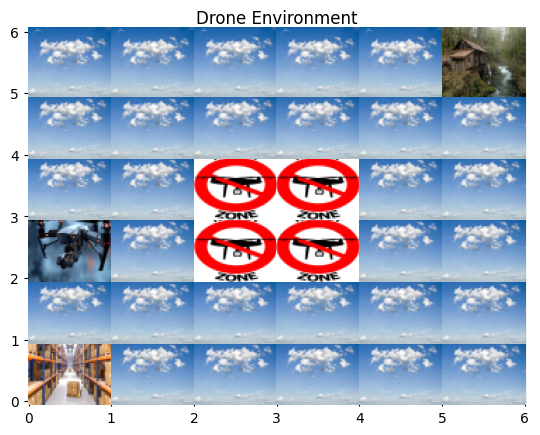

'state': (0, 2, 0),'action': 1, 'reward' : -1


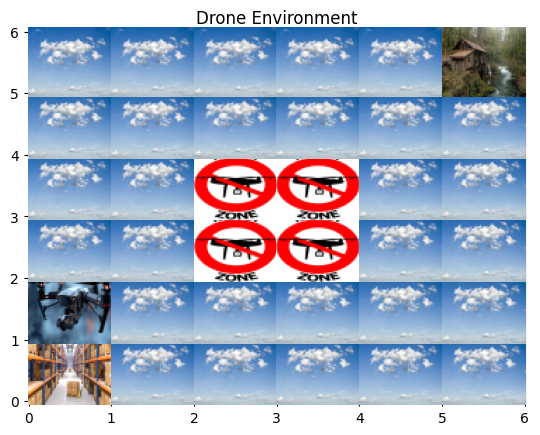

'state': (0, 1, 0),'action': 1, 'reward' : -1


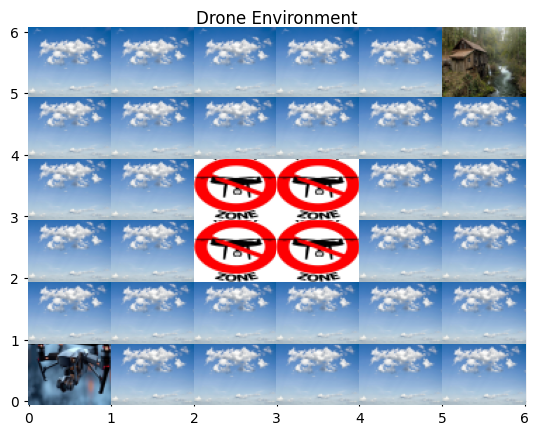

'state': (0, 0, 0),'action': 4, 'reward' : 25


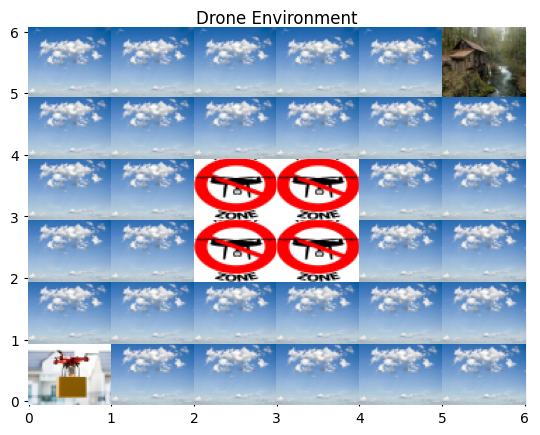

'state': (0, 0, 1),'action': 3, 'reward' : -1


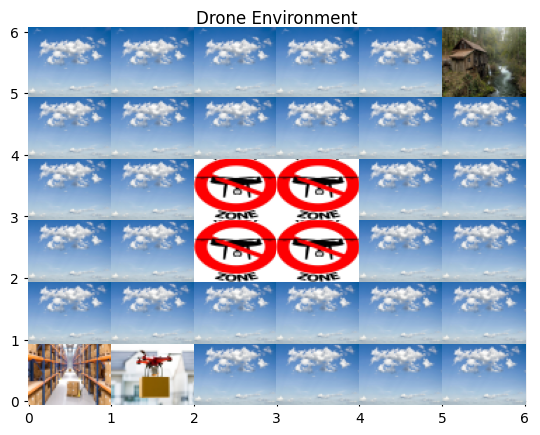

'state': (1, 0, 1),'action': 3, 'reward' : -1


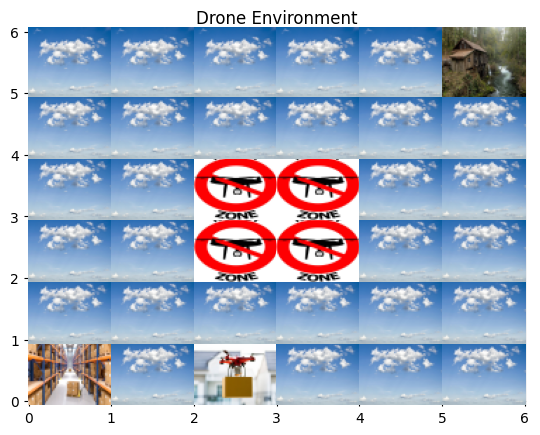

'state': (2, 0, 1),'action': 3, 'reward' : -1


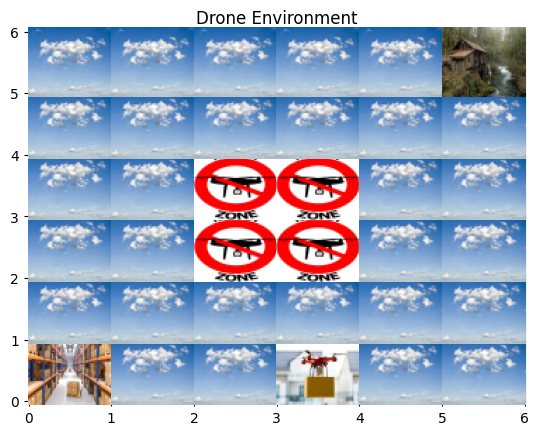

'state': (3, 0, 1),'action': 3, 'reward' : -1


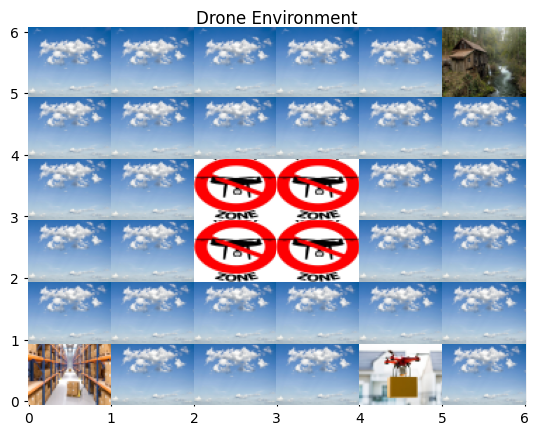

'state': (4, 0, 1),'action': 0, 'reward' : -1


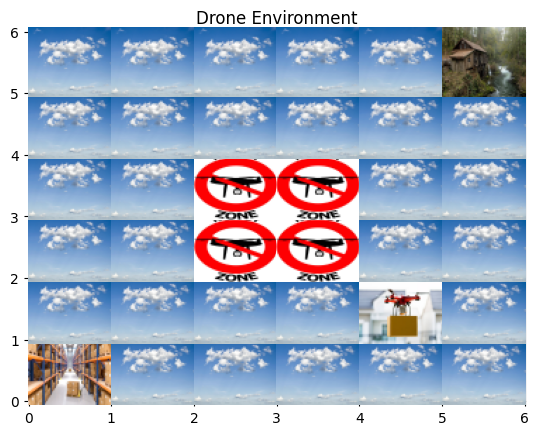

'state': (4, 1, 1),'action': 0, 'reward' : -1


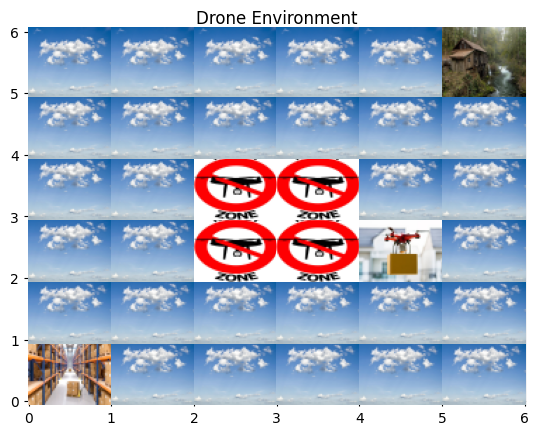

'state': (4, 2, 1),'action': 3, 'reward' : -1


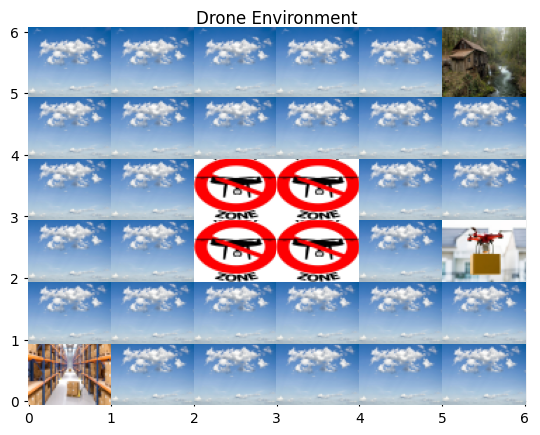

'state': (5, 2, 1),'action': 0, 'reward' : -1


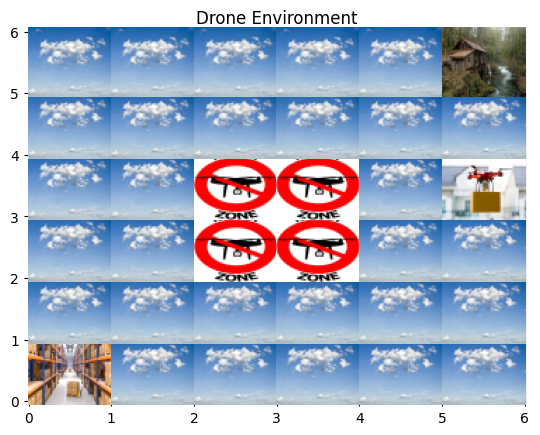

'state': (5, 3, 1),'action': 0, 'reward' : -1


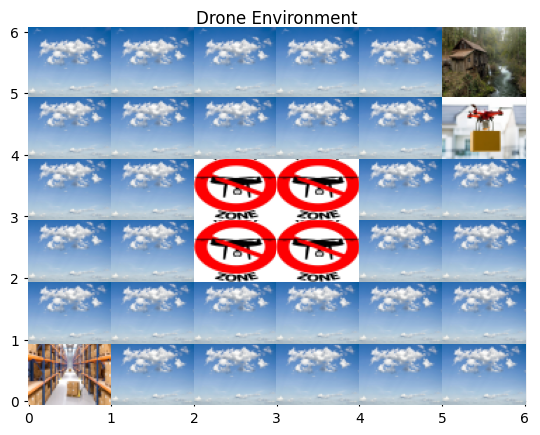

'state': (5, 4, 1),'action': 0, 'reward' : -1


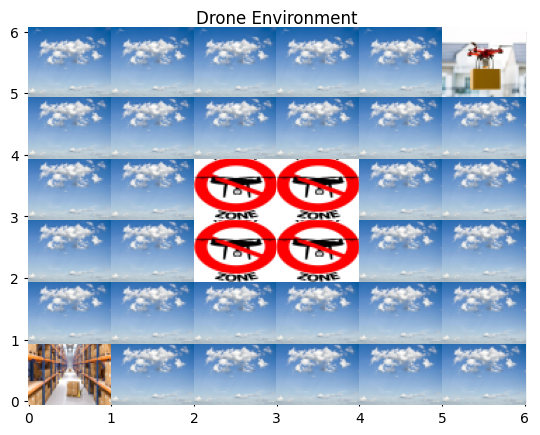

'state': (5, 5, 1),'action': 5, 'reward' : 100

SARSA agent performance summary:
Average evaluation reward is: 110.70
Standard deviation is: 2.41


In [64]:
env = AutoDrone()
sarsa_agent = SARSAAgent(env)
print("\nInitial Qtable:")
print(sarsa_agent.qTable)
rewards_det_SARSA, epsilons = sarsa_agent.train()
print("\nTrained Qtable:")
print(sarsa_agent.qTable)
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(rewards_det_SARSA)
plt.title('SARSA agent total Reward per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')

plt.subplot(1, 2, 2)
plt.plot(epsilons)
plt.title('SARSA agent Epsilon Decay')
plt.xlabel('Episode')
plt.ylabel('Epsilon')

plt.tight_layout()
plt.savefig('sarsa_training_results.png')
plt.show()

test_rewards, _ = sarsa_agent.test(eps=10)

plt.figure(figsize=(8, 5))
plt.plot(test_rewards)
plt.title('SARSA agent test results')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.savefig('sarsa_test_results.png')
plt.show()
    
_, ep_info = sarsa_agent.test(eps=1, render=True)   
 
with open('sarsa_qtable_det.pkl', 'wb') as f:
    pickle.dump(sarsa_agent.qTable, f)
    
print("\nSARSA agent performance summary:")
print(f"Average evaluation reward is: {np.mean(test_rewards):.2f}")
print(f"Standard deviation is: {np.std(test_rewards):.2f}")

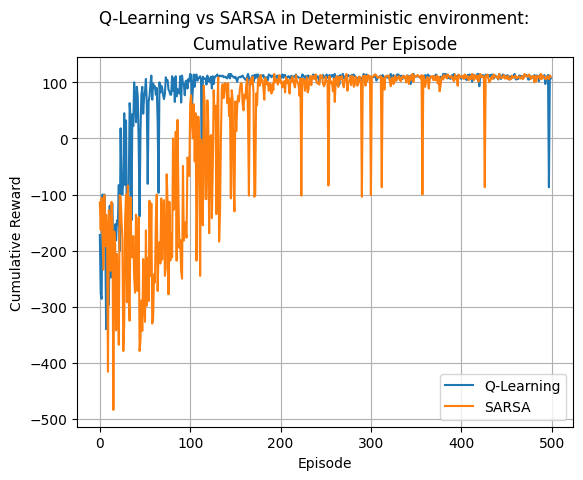

In [65]:
plt.figure()
plt.suptitle(f'Q-Learning vs SARSA in Deterministic environment: ')
x = range(500)
plt.plot(x,final_rewards_det_qlearn[:500],label='Q-Learning')
plt.plot(x,rewards_det_SARSA[:500], label='SARSA')
plt.xlabel('Episode')
plt.ylabel('Cumulative Reward')
plt.title('Cumulative Reward Per Episode')
plt.grid()
plt.legend()
